# Documentation
**Author:** Spencer Ressel

**Created:** February 20th, 2024

***

This notebook analyzes aqua-planet simulation data from the CAM6 model run by Mu-Ting Chien.
For simulation details, see: https://doi.org/10.1029/2024MS004378

In particular, regression analysis is performed on variable data to understand the structure of the Madden-Julian Oscillation in the simulation data

### This file requires other files in the aquaplanet_analysis folder and in the auxiliary_functions folder
 - config.py
 - load_aquaplanet_data.py

***

# Imports

In [367]:
%load_ext autoreload
%autoreload 2

print("Loading imports...")
# Aquaplanet analysis config file
from config import *

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# File management
import glob
import os
import sys
from datetime import datetime, timedelta
import copy
import cftime

# Data anaylsis
import numpy as np
import scipy
import xarray as xr
import xeofs
xr.set_options(keep_attrs=True)
import scipy.signal as signal
from scipy.stats import t

# Plotting
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import ticker as mticker
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches
from cartopy import util as cutil
from plotting_functions import *

# Auxiliary functions
from load_aquaplanet_data import *
from processing_functions import *
from standardize_data import standardize_data
from auxiliary_functions.modified_colormap import modified_colormap
from auxiliary_functions.bmh_colors import bmh_colors
from auxiliary_functions.one_two_one_filter import one_two_one_filter
from auxiliary_functions.tick_labeller import tick_labeller
from auxiliary_functions.rounding_functions import round_out

print("Imports loaded")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Loading imports...
Imports loaded


# Specify analysis parameters

In [2]:
# Set latitude bounds
LATITUDE_SOUTH = -30
LATITUDE_NORTH = 30
latitude_subset_bounds = slice(LATITUDE_SOUTH, LATITUDE_NORTH)

# Set central longitude
CENTRAL_LONGITUDE = 0

# Set longitude bounds
LONGITUDE_MIN = 0
LONGITUDE_MAX = 360

# Set time bounds
missing_days = [
    cftime.DatetimeNoLeap(7, 2, 5, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 6, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 7, 0, 0, 0, 0, has_year_zero=True),
]

START_TIME = cftime.DatetimeNoLeap(3, 1, 3, 0, 0, 0, 0, has_year_zero=True)
END_TIME = cftime.DatetimeNoLeap(13, 1, 3, 0, 0, 0, 0, has_year_zero=True)
first_half_subset_bounds = slice(START_TIME, missing_days[0] - timedelta(days=1))
second_half_subset_bounds = slice(missing_days[-1] + timedelta(days=1), END_TIME)

# Cut-off periods for intraseasonal filtering
INTRASEASONAL_LOWCUT = 100
INTRASEASONAL_HIGHCUT = 20
frequency_subset_bounds = slice(INTRASEASONAL_LOWCUT, INTRASEASONAL_HIGHCUT)

# Cut-off wavenumbers for MJO-filtering
LARGE_SCALE_CUTOFF = 1
SMALL_SCALE_CUTOFF = 3
wavenumber_bounds = slice(LARGE_SCALE_CUTOFF, SMALL_SCALE_CUTOFF)

# Column-integrated bounds
LOWER_LEVEL_PRESSURE = 950
UPPER_LEVEL_PRESSURE = 100
pressure_subset_bounds = slice(UPPER_LEVEL_PRESSURE, LOWER_LEVEL_PRESSURE)

# Load data

In [387]:
reload_variables = False

# experiment_to_load = '4K'
variables_to_load = [
    "Precipitation",
    # "Outgoing Longwave Radiation",
    "Zonal Wind",
    "Meridional Wind",
    "Vertical Wind",
    # "Temperature",
    "Moisture",
    # "Relative Humidity",
    # "Geopotential Height",
    # "Longwave Heating Rate",
    # "Shortwave Heating Rate",
    "Latent Heat Flux",
    # "Sensible Heat Flux",
    # "Surface Pressure",
    # "Moist Static Energy",
    # "Column Moist Static Energy",
    "Column Water Vapor",
    # "Column Temperature",
    # "Column Longwave Heating",
    # "Column Shortwave Heating",
    # "Potential Temperature",
    # "Saturation Specific Humidity",
    # "Column Relative Humidity",
    # "Diabatic Heating",
    # "Chikira alpha"
    "Zonal Moisture Advection",
    "Meridional Moisture Advection",
    "Vertical Moisture Advection",
    'Moisture Tendency',
    'Zonal Advection',
    'Meridional Advection',
    'Vertical Advection',
    'Evaporation',
    'Residual'
]

# if reload_variables or 'variables_dict' not in globals():
#     variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)
# else:
#     new_variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)

#     # If not reloading, append new variables to existing dict
#     for variable_name, variable_data in new_variables_dict.items():
#         if variable_name not in variables_dict.keys():
#             print(f"Adding {variable_name} to Active Variables...", end="")
#             variables_dict[variable_name] = variable_data
#             print(rf"{'✔':>1}")

# print('=' * str_width)
# print(f"\nActive Variables:")
# print("\n".join([key for key in variables_dict.keys()]))

# Load pre-processed data

## Subset data

In [4]:
if not 'multi_experiment_variables_subset' in locals():
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        'subset'
    )
else:
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        'subset',
        multi_experiment_variables_subset,
        False
    )

          Loading subset data           
(1/10) Precipitation...                 
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(2/10) Zonal Wind...                    
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(3/10) Meridional Wind...               
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(4/10) Vertical Wind...                 
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                

## MJO-filtered

In [4]:
if not 'multi_experiment_variables_mjo_filtered' in locals():
    multi_experiment_variables_mjo_filtered = load_multi_experiment_processed_data(
        ['Precipitation', 'Outgoing Longwave Radation', 'Moisture'],
        'mjo_filtered'
    )
else:
    multi_experiment_variables_mjo_filtered = load_multi_experiment_processed_data(
        ['Precipitation', 'Outgoing Longwave Radation', 'Moisture'],
        'mjo_filtered',
        multi_experiment_variables_mjo_filtered,
        False
    )

       Loading mjo_filtered data        
(1/3) Precipitation...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(2/3) Outgoing Longwave Radation...     
----------------------------------------
Loading data...
    Experiment: -4K                    ✘
    No data
    Experiment: 0K                     ✘
    No data
    Experiment: 4K                     ✘
    No data
(3/3) Moisture...                       
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
----------------------------------------
Data Loaded


In [6]:
# if not 'multi_experiment_variables_rossby_filtered' in locals():
#     multi_experiment_variables_rossby_filtered = load_multi_experiment_processed_data(
#         variables_to_load,
#         'rossby_filtered'
#     )
# else:
#     multi_experiment_variables_rossby_filtered = load_multi_experiment_processed_data(
#         variables_to_load,
#         'rossby_filtered',
#         multi_experiment_variables_rossby_filtered,
#         False
#     )

## Pre-processed Regression data

In [5]:
# print(f"{f'Loading regressed data':^{str_width}}")
# # print(f"{'='*str_width}")
# reference_variable = 'QU'
# regression_wave_type = 'MJO'

# reload_regressed = True
# variable_data_by_experiment = {}
# if not 'multi_experiment_variables_regressed' in globals() or reload_regressed:
#     multi_experiment_variables_regressed = {}
# if not 'multi_experiment_significant_indices' in globals() or reload_regressed:
#     multi_experiment_significant_indices = {}

# for index, variable_name in enumerate(variables_to_load):
#     # Print the variable name
#     print(f"{'='*str_width}")
#     print(f"{f'({index+1}/{len(variables_to_load)}) {variable_name}...':<{str_width}}")
#     print(f"{'-'*str_width}")

#     # For each variable, loop over the experiments and find/load the data
#     print("Loading data...")
#     file_location = rf"{data_directory}/multi_experiment_variables_regressed"
#     regressed_files = glob.glob(
#         f"{file_location}/multi_experiment_rescaled_{variable_name.lower().replace(' ', '_')}"
#         + f"_{regression_wave_type}-{reference_variable}.nc"
#     )

#     # Does the variable have data?
#     if regressed_files:
#         # Append it to the list
#         for index, file in enumerate(regressed_files):
#             regression_data = xr.open_dataset(file)
#             print(f"{f'    Coefficients...':<{str_width-1}}", end="")
#             multi_experiment_variables_regressed[variable_name] = regression_data[f"{variable_name} - Coefficients"]
#             multi_experiment_variables_regressed[variable_name].name = variable_name
#             print(rf"{'✔':>1}")

#             print(f"{f'    Significant Indices...':<{str_width-1}}", end="")
#             multi_experiment_significant_indices[variable_name] = regression_data[f"{variable_name} - Significance"]
#             multi_experiment_significant_indices[variable_name].name = variable_name
#             print(rf"{'✔':>1}")

#     else:
#         # Move on to the next variable
#         print(rf"{'✘':>1}")
#         print(f"    No data")

# print(f"{'='*str_width}")
# print("Finished")

In [26]:
print(f"{f'Loading regressed data':^{str_width}}")
# print(f"{'='*str_width}")
# reference_variable = 'QU'
regression_wave_type = 'MJO'
data_type = 'regressed'

reload_regressed = True
variable_data_by_experiment = {}
if not 'multi_experiment_variables_regressed' in globals() or reload_regressed:
    multi_experiment_variables_regressed = {}
if not 'multi_experiment_significant_indices' in globals() or reload_regressed:
    multi_experiment_significant_indices = {}


for index, variable_name in enumerate(variables_to_load):
    # Print the variable name
    print(f"{'='*str_width}")
    print(f"{f'({index+1}/{len(variables_to_load)}) {variable_name}...':<{str_width}}")
    print(f"{'-'*str_width}")

    multi_experiment_variables_regressed[variable_name] = {}
    multi_experiment_significant_indices[variable_name] = {}
    for reference_variable in ['QU', 'QL']:

        # For each variable, loop over the experiments and find/load the data
        print(f"Loading {reference_variable} data...")
        file_location = rf"{data_directory}/multi_experiment_variables_regressed"
        regressed_files = glob.glob(
            f"{file_location}/multi_experiment_rescaled_{variable_name.lower().replace(' ', '_')}"
            + f"_{regression_wave_type}-{reference_variable}.nc"
        )

        # Does the variable have data?
        if regressed_files:
            # Append it to the list
            for index, file in enumerate(regressed_files):
                regression_data = xr.open_dataset(file)
                print(f"{f'    Coefficients...':<{str_width-1}}", end="")
                multi_experiment_variables_regressed[variable_name][reference_variable] = regression_data[f"{variable_name} - Coefficients"]
                multi_experiment_variables_regressed[variable_name][reference_variable].name = variable_name
                print(rf"{'✔':>1}")

                print(f"{f'    Significant Indices...':<{str_width-1}}", end="")
                multi_experiment_significant_indices[variable_name][reference_variable] = regression_data[f"{variable_name} - Significance"]
                multi_experiment_significant_indices[variable_name][reference_variable].name = variable_name
                print(rf"{'✔':>1}")

        else:
            # Move on to the next variable
            print(rf"{'✘':>1}")
            print(f"    No data")

    multi_experiment_variables_regressed[variable_name] = xr.concat(
        [multi_experiment_variables_regressed[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
        dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
    )

    multi_experiment_significant_indices[variable_name] = xr.concat(
        [multi_experiment_significant_indices[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
        dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
    )

reference_variable = 'QU-QL'

print(f"{'='*str_width}")
print("Finished")

         Loading regressed data         
(1/10) Precipitation...                 
----------------------------------------
Loading QU data...
    Coefficients...                    ✔
    Significant Indices...             ✔
Loading QL data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(2/10) Zonal Wind...                    
----------------------------------------
Loading QU data...
    Coefficients...                    ✔
    Significant Indices...             ✔
Loading QL data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(3/10) Meridional Wind...               
----------------------------------------
Loading QU data...
    Coefficients...                    ✔
    Significant Indices...             ✔
Loading QL data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(4/10) Vertical Wind...                 
----------------------------------------
Loading QU data...
    Co

In [388]:
print(f"{f'Loading correlated data':^{str_width}}")
# print(f"{'='*str_width}")
regression_wave_type = 'MJO'
data_type = 'correlated'

reload_correlated = True
variable_data_by_experiment = {}
if not 'multi_experiment_variables_correlated' in globals() or reload_correlated:
    multi_experiment_variables_correlated = {}
if not 'multi_experiment_significant_indices' in globals() or reload_correlated:
    multi_experiment_significant_indices = {}


for index, variable_name in enumerate(variables_to_load):
    multi_experiment_variables_correlated[variable_name] = {}
    multi_experiment_significant_indices[variable_name] = {}
    for reference_variable in ['QU', 'QL']:
        # Print the variable name
        print(f"{'='*str_width}")
        print(f"{f'({index+1}/{len(variables_to_load)}) {variable_name}...':<{str_width}}")
        print(f"{'-'*str_width}")

        # For each variable, loop over the experiments and find/load the data
        print("Loading data...")
        file_location = rf"{data_directory}/multi_experiment_variables_correlated"
        correlated_files = glob.glob(
            f"{file_location}/multi_experiment_{variable_name.lower().replace(' ', '_')}"
            + f"_{regression_wave_type}-{reference_variable}.nc"
        )

        # Does the variable have data?
        if correlated_files:
            # Append it to the list
            for index, file in enumerate(correlated_files):
                correlation_data = xr.open_dataset(file)
                print(f"{f'    Coefficients...':<{str_width-1}}", end="")
                multi_experiment_variables_correlated[variable_name][reference_variable] = correlation_data[f"{variable_name} - Coefficients"]
                multi_experiment_variables_correlated[variable_name][reference_variable].name = variable_name
                print(rf"{'✔':>1}")

                print(f"{f'    Significant Indices...':<{str_width-1}}", end="")
                multi_experiment_significant_indices[variable_name][reference_variable] = correlation_data[f"{variable_name} - Significance"]
                multi_experiment_significant_indices[variable_name][reference_variable].name = variable_name
                print(rf"{'✔':>1}")

        else:
            # Move on to the next variable
            print(rf"{'✘':>1}")
            print(f"    No data")

    multi_experiment_variables_correlated[variable_name] = xr.concat(
        [multi_experiment_variables_correlated[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
        dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
    )
    multi_experiment_significant_indices[variable_name] = xr.concat(
        [multi_experiment_significant_indices[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
        dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
    )

reference_variable = 'QU-QL'

print(f"{'='*str_width}")
print("Finished")

        Loading correlated data         
(1/16) Precipitation...                 
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(1/16) Precipitation...                 
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(2/16) Zonal Wind...                    
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(1/16) Zonal Wind...                    
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(3/16) Meridional Wind...               
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(1/16) Meridional Wind...               
------------------

In [381]:
data_directory = r"/glade/campaign/univ/uwas0152/post_processed_data/"
budget_to_load = 'moisture'
data_source_to_load = 'daily_model-level'
budget_data_location = f"{data_directory}/{budget_to_load}_budget_terms/{data_source_to_load}_data"
multi_experiment_budget_variables = {}

budget_variables_to_load = [
            'Moisture',
            'Moisture Tendency',
            'Zonal Advection',
            'Meridional Advection',
            'Vertical Advection',
            'Evaporation',
            'Precipitation',
            'Residual'
        ]

for index, variable_name in enumerate(budget_variables_to_load):
    data = xr.open_dataset(f"{budget_data_location}/multi_experiment_{variable_name.lower().replace(' ', '_')}.nc")
    for variable_data in data.data_vars.values():
        print(f"{f'({index+1}/{len(budget_variables_to_load)}) {variable_name}...':<{str_width-1}}", end="")
        multi_experiment_budget_variables[variable_name] = variable_data
        print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 ✔
(8/8) Residual...                      ✔
Finished


# Calculate regressions

## Define Reference Timeseries

### Upper- & Lower-level Moisture

In [382]:
print("Define Upper- & Lower-level Moisture")
print(f"{'='*str_width}")

longitude_bounds = (175, 185)
latitude_bounds = (-5, 5)

multi_experiment_variables_mjo_filtered['Lower Level Moisture'] = (
    (100/9.81)*multi_experiment_variables_mjo_filtered['Moisture'].sel(
        plev=slice(700, 975),
        lat=slice(*latitude_bounds),
        lon=slice(*longitude_bounds)
    ).integrate('plev').mean(dim=['lat', 'lon'])
)
multi_experiment_variables_mjo_filtered['Lower Level Moisture'].name = 'Lower Level Moisture'
multi_experiment_variables_mjo_filtered['Lower Level Moisture'].attrs['short_name'] = 'q_L'
multi_experiment_variables_mjo_filtered['Lower Level Moisture'].attrs['file_id'] = 'QL'
multi_experiment_variables_mjo_filtered['Lower Level Moisture'].attrs['units'] = 'kg/kg'
multi_experiment_variables_mjo_filtered['Lower Level Moisture'].attrs['domain'] = '975-700 hPa'

multi_experiment_variables_mjo_filtered['Upper Level Moisture'] = (
    (100/9.81)*multi_experiment_variables_mjo_filtered['Moisture'].sel(
        plev=slice(300, 700),
        lat=slice(*latitude_bounds),
        lon=slice(*longitude_bounds)
    ).integrate('plev').mean(dim=['lat', 'lon'])
)

multi_experiment_variables_mjo_filtered['Upper Level Moisture'].name = 'Upper Level Moisture'
multi_experiment_variables_mjo_filtered['Upper Level Moisture'].attrs['short_name'] = 'q_U'
multi_experiment_variables_mjo_filtered['Upper Level Moisture'].attrs['file_id'] = 'QU'
multi_experiment_variables_mjo_filtered['Upper Level Moisture'].attrs['units'] = 'kg/kg'
multi_experiment_variables_mjo_filtered['Upper Level Moisture'].attrs['domain'] = '700-300 hPa'

print(f"{'='*str_width}")
print("Finished")

Define Upper- & Lower-level Moisture
Finished


## Regress variables

In [25]:
save_regressed_variables = False
# reference_variable = 'Precipitation'
reference_variable = 'Lower Level Moisture'
data_type = 'regressed'

# Initialize the dictionary to hold the regressed values
multi_experiment_variables_regressed = {}

# # Identify the location of the reference time series
reference_latitude = (
    multi_experiment_variables_mjo_filtered['Precipitation']
).var(dim='time').mean(dim='lon').idxmax(dim='lat')
reference_longitude = 180*xr.ones_like(reference_latitude)

reference_latitude = xr.zeros_like(reference_latitude)
reference_longitude = 180*xr.ones_like(reference_latitude)

# selected_data = [
#     ds.sel(
#         lon=reference_longitude.sel(experiment=experiment),
#         lat=reference_latitude.sel(experiment=experiment),
#         method="nearest"
#     )
#     for experiment, ds in zip(experiments_list, multi_experiment_variables_mjo_filtered[reference_variable])
#     # for experiment, ds in zip(experiments_list, mjo_filtered_moisture.sel(plev=slice(100,975)).integrate('plev'))
# ]

# # Concatenate along the 'experiment' dimension
# reference_timeseries = xr.concat(selected_data, dim="experiment")
# reference_longitude = 180
# reference_latitude = 0
reference_timeseries = multi_experiment_variables_mjo_filtered[reference_variable]
standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

N = len(standardized_reference_timeseries.time)
t_critical = t.ppf(0.95, df=N-2)

significant_regression_indices = {}

print(f"{'Regressions':^{str_width}}")
print(f"{f'Regression Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

# for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
for index, (variable_name, variable_data) in enumerate(multi_experiment_budget_variables.items()):

    # if not variable_name in variables_to_load:
    #     print(f"{variable_name} not in variables to load, skipping...")
    #     continue

    # print(f'{f"({index+1}/{len(multi_experiment_variables_subset)}) {variable_name}...":<{str_width-1}}', end="")
    print(f'{f"({index+1}/{len(multi_experiment_budget_variables)}) {variable_name}...":<{str_width-1}}', end="")

    # Remove the time mean of the variables to be regressed
    variable_data_anomalies = standardize_data(variable_data, unit_variance=False, dim='time')

    # Regress the variable anomalies onto the reference timeseries
    multi_experiment_variables_regressed[variable_name] = xr.dot(
        standardized_reference_timeseries,
        variable_data_anomalies,
        dim='time'
    ) / len(standardized_reference_timeseries.time)
    multi_experiment_variables_regressed[variable_name].attrs = variable_data_anomalies.attrs
    multi_experiment_variables_regressed[variable_name].name = variable_name

    # Calculate the statstical significance of the regression coefficients
    predicted_value = multi_experiment_variables_regressed[variable_name] * standardized_reference_timeseries
    residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
    residual_variance = residual_sum_of_squares / (N - 2)
    standard_error_slope = np.sqrt(residual_variance / (N - 1))
    t_statistic = multi_experiment_variables_regressed[variable_name] / standard_error_slope
    significant_regression_indices[variable_name] = np.abs(t_statistic) > t_critical

    print(rf"{'✔':>1}")

print(f"{'-'*str_width}")
rescaled_multi_experiment_variables_regressed = {}
rescaled_multi_experiment_variables_regressed = copy.deepcopy(multi_experiment_variables_regressed)
if reference_variable == 'Outgoing Longwave Radiation':
    print("Re-scaling regressed timeseries")

    rescaling_factor = (
        -40 / multi_experiment_variables_regressed['Outgoing Longwave Radiation'].sel(lat=reference_latitude, lon=reference_longitude)
    )
    for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_regressed.items()):
        print(f'{f"({index+1}/{len(multi_experiment_variables_regressed)}) {variable_name}...":<{str_width-1}}', end="")
        multi_experiment_variables_regressed[variable_name][:] *= rescaling_factor.copy(deep=True)
        multi_experiment_variables_regressed[variable_name].attrs['rescaled'] = 'True'
        print(rf"{'✔':>1}")

elif reference_variable == 'Precipitation' or reference_variable == 'Upper Level Moisture' or reference_variable == 'Lower Level Moisture':
    print("Re-scaling regressed timeseries")

    for ((experiment_index, experiment), latitude, longitude) in zip(enumerate(experiments_list), reference_latitude, reference_longitude):
        print(f'{f"{experiment}...":<{str_width-1}}')
        rescaling_factor = (
            15 / multi_experiment_variables_regressed['Precipitation'].sel(experiment=experiment).sel(lat=latitude, lon=longitude, method='nearest')
        )
        # rescaling_factor = (
        #     15 / multi_experiment_variables_regressed['Precipitation'].sel(experiment=experiment).max()
        # )
        for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_regressed.items()):
            print(f'{f"({index+1}/{len(multi_experiment_variables_regressed)}) {variable_name}...":<{str_width-1}}', end="")
            rescaled_multi_experiment_variables_regressed[variable_name][experiment_index, :] = (
                rescaling_factor.copy(deep=True)
                * multi_experiment_variables_regressed[variable_name].sel(experiment=experiment)
            )
            rescaled_multi_experiment_variables_regressed[variable_name].attrs['rescaled'] = 'True'
            print(rf"{'✔':>1}")
        print(f"{'-'*str_width}")

print(f"{'-'*str_width}")

if save_regressed_variables:
    print(f"{'Saving regressed variables':^{str_width}}")
    print(f"{'='*str_width}")

    for index, (variable_name, variable_data) in enumerate(rescaled_multi_experiment_variables_regressed.items()):
        print(f"{f'({index+1}/{len(rescaled_multi_experiment_variables_regressed)}) {variable_name}...':<{str_width-1}}", end="")
        rescaled_multi_experiment_variables_regressed[variable_name].name = variable_name
        significant_regression_indices[variable_name].name = variable_name

        filename = (
            f"{data_directory}/multi_experiment_variables_regressed/"
            + f"multi_experiment_rescaled_{variable_name.lower().replace(' ', '_')}_"
            # + f"MJO-{rescaled_multi_experiment_variables_regressed[reference_variable].attrs['file_id']}.nc"
            + f"MJO-QL.nc"
        )
        combined_data = xr.Dataset(
            {
                f"{variable_name} - Coefficients": rescaled_multi_experiment_variables_regressed[variable_name],
                f"{variable_name} - Significance": significant_regression_indices[variable_name]
            }
        )
        if os.path.exists(filename):
            # Prompt user for confirmation
            response = input(f"\nFile '{filename}' already exists. Overwrite? (y/n): ").strip().lower()
            # response = 'y'
            if response == 'y':
                os.remove(filename)  # Delete the existing file

                # combined_data["name"] = variable_data.name
                combined_data.to_netcdf(filename)  # Save the new file
                print(rf"{'✔ (overwritten)':>1}")
            else:
                print(rf"{'✘ (skipped)':>1}")
        else:
            combined_data.to_netcdf(filename)  # Save the new file
            print(rf"{'✔':>1}")
else:
    print(f"{'Not saving regressed variables':<{str_width}}")

print(f"{'='*str_width}")
print("Finished")

KeyError: 'Lower Level Moisture'

## Correlate variables

In [386]:
save_correlated_variables = True
# reference_variable = 'Precipitation'
data_type = 'correlated'
reference_variable = 'Upper Level Moisture'

# Initialize the dictionary to hold the correlated values
multi_experiment_variables_correlated = {}

# # Identify the location of the reference time series
reference_latitude = (
    multi_experiment_variables_mjo_filtered['Precipitation']
).var(dim='time').mean(dim='lon').idxmax(dim='lat')
reference_longitude = 180*xr.ones_like(reference_latitude)

reference_latitude = xr.zeros_like(reference_latitude)
reference_longitude = 180*xr.ones_like(reference_latitude)

# selected_data = [
#     ds.sel(
#         lon=reference_longitude.sel(experiment=experiment),
#         lat=reference_latitude.sel(experiment=experiment),
#         method="nearest"
#     )
#     for experiment, ds in zip(experiments_list, multi_experiment_variables_mjo_filtered[reference_variable])
#     # for experiment, ds in zip(experiments_list, mjo_filtered_moisture.sel(plev=slice(100,975)).integrate('plev'))
# ]

# # Concatenate along the 'experiment' dimension
# reference_timeseries = xr.concat(selected_data, dim="experiment")
# reference_longitude = 180
# reference_latitude = 0
reference_timeseries = multi_experiment_variables_mjo_filtered[reference_variable]
standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

N = len(standardized_reference_timeseries.time)
t_critical = t.ppf(0.95, df=N-2)

significant_correlation_indices = {}

print(f"{'Correlations':^{str_width}}")
print(f"{f'Correlation Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

# for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
for index, (variable_name, variable_data) in enumerate(multi_experiment_budget_variables.items()):

    # if not variable_name in variables_to_load:
    #     print(f"{variable_name} not in variables to load, skipping...")
    #     continue

    print(f'{f"({index+1}/{len(multi_experiment_budget_variables)}) {variable_name}...":<{str_width-1}}', end="")

    # Remove the time mean of the variables to be correlated
    variable_data_anomalies = standardize_data(variable_data, unit_variance=True, dim='time')

    # Regress the variable anomalies onto the reference timeseries
    multi_experiment_variables_correlated[variable_name] = xr.dot(
        standardized_reference_timeseries,
        variable_data_anomalies,
        dim='time'
    ) / len(standardized_reference_timeseries.time)
    multi_experiment_variables_correlated[variable_name].attrs = variable_data_anomalies.attrs
    multi_experiment_variables_correlated[variable_name].name = variable_name

    # Calculate the statstical significance of the correlation coefficients
    predicted_value = multi_experiment_variables_correlated[variable_name] * standardized_reference_timeseries
    residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
    residual_variance = residual_sum_of_squares / (N - 2)
    standard_error_slope = np.sqrt(residual_variance / (N - 1))
    t_statistic = multi_experiment_variables_correlated[variable_name] / standard_error_slope
    significant_correlation_indices[variable_name] = np.abs(t_statistic) > t_critical

    print(rf"{'✔':>1}")

print(f"{'-'*str_width}")

if save_correlated_variables:
    print(f"{'Saving correlated variables':^{str_width}}")
    print(f"{'='*str_width}")

    for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_correlated.items()):
        print(f"{f'({index+1}/{len(multi_experiment_variables_correlated)}) {variable_name}...':<{str_width-1}}", end="")
        multi_experiment_variables_correlated[variable_name].name = variable_name
        significant_correlation_indices[variable_name].name = variable_name

        filename = (
            f"{data_directory}/multi_experiment_variables_correlated/"
            + f"multi_experiment_{variable_name.lower().replace(' ', '_')}_"
            + f"MJO-{multi_experiment_variables_mjo_filtered[reference_variable].attrs['file_id']}.nc"
        )
        combined_data = xr.Dataset(
            {
                f"{variable_name} - Coefficients": multi_experiment_variables_correlated[variable_name],
                f"{variable_name} - Significance": significant_correlation_indices[variable_name]
            }
        )
        if os.path.exists(filename):
            # Prompt user for confirmation
            response = input(f"\nFile '{filename}' already exists. Overwrite? (y/n): ").strip().lower()
            # response = 'y'
            if response == 'y':
                os.remove(filename)  # Delete the existing file

                # combined_data["name"] = variable_data.name
                combined_data.to_netcdf(filename)  # Save the new file
                print(rf"{'✔ (overwritten)':>1}")
            else:
                print(rf"{'✘ (skipped)':>1}")
        else:
            combined_data.to_netcdf(filename)  # Save the new file
            print(rf"{'✔':>1}")
else:
    print(f"{'Not saving correlated variables':<{str_width}}")

print(f"{'='*str_width}")
print("Finished")

              Correlations              
Correlation Variable: Upper Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 ✔
(8/8) Residual...                      ✔
----------------------------------------
      Saving correlated variables       
(1/8) Moisture...                      


File '/glade/campaign/univ/uwas0152/post_processed_data//multi_experiment_variables_correlated/multi_experiment_moisture_MJO-QU.nc' already exists. Overwrite? (y/n):  n


✘ (skipped)
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 


File '/glade/campaign/univ/uwas0152/post_processed_data//multi_experiment_variables_correlated/multi_experiment_precipitation_MJO-QU.nc' already exists. Overwrite? (y/n):  n


✘ (skipped)
(8/8) Residual...                      ✔
Finished


# Plot regressed variables

## Latitude-Longitude

In [30]:
savefig = False
statistically_significant = False
fontsize = 14
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(8, 12))
gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.1)

longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])
# cbar_axes = []
# cbar_axes.append(fig.add_subplot(gs[0,-1]))
# cbar_axes.append(fig.add_subplot(gs[1,-1]))
# cbar_axes.append(fig.add_subplot(gs[2,-1]))

contour_variable = 'Column Water Vapor'
# contourf_variable = 'Meridional Moisture Advection'
contourf_variable = 'Precipitation'
plev_to_plot = 'None'
# plev_to_plot = 500

if data_type == 'regressed':
    #### Contourf variable
    if 'Moisture Advection' in contourf_variable:
        ### Advection Variables
        contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
             (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(plev=plev_to_plot)
        contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

    else:
        contourf_data = multi_experiment_variables_regressed[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_regressed[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )

elif data_type == 'correlated':
    #### Contourf variable
    contourf_data = multi_experiment_variables_correlated[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_correlated[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_correlated['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_correlated['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )


letter = ['a', 'b', 'c']

if plev_to_plot != 'None':
    fig.suptitle(f"{plev_to_plot}-hPa {contourf_data.name} (colors) \n& {plev_to_plot}-hPa {contour_data.name} (contours) \n regressed onto {reference_variable}", y=1.025)
else:
    fig.suptitle(f"{contourf_data.name} (colors) \n& {contour_data.name} (contours) \n regressed onto {reference_variable}", y=1.025)

for index, (ax, experiment) in enumerate(zip(axes, experiments_list)):

    ax.set_title(f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}", loc='left')
    ax.set_facecolor('white')

    cdata, clon = cutil.add_cyclic_point(
        contourf_data.sel(experiment=experiment),
        coord=contourf_data.lon,
    )

    # grand_max = variable_data.sel(experiment=experiment).max()
    # grand_min = variable_data.sel(experiment=experiment).min()
    grand_max = contourf_data.max()
    grand_min = contourf_data.min()

    # if contourf_variable == 'Precipitation':
    #     levels = np.arange(-15, 15+2.5, 2.5)
    # else:
        # levels = np.arange(
        #     round_out(grand_min, 1),
        #     round_out(grand_max, 1)+2.5,
        #     2.5
        # )
        # levels = np.linspace(grand_min, grand_max, 21)

    cmap = modified_colormap('BrBG', 'white', 0.05, 0.05)
    cmap.set_bad('white')
    # Plot data
    im = ax.contourf(
        clon,
        contourf_data.lat,
        cdata,
        # cmap='BrBG',
        cmap=cmap,
        # cmap='BrBG',
        # levels=np.linspace(grand_min, grand_max, 21),
        levels=21,
        # levels=levels,
        norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values))),
        extend='both'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        # cax=cbar_axes[index],
        cax=cbar_ax,
        label=contourf_data.attrs['units'],
        orientation="vertical",
    )
    # cbar.set_ticks()
    cbar.ax.tick_params(labelsize=fontsize)

    # ax.contour(
    #     clon,
    #     variable_data.lat,
    #     cdata,
    #     colors='gray',
    #     levels=levels[np.abs(levels) >= 0.1],
    #     linewidths=1
    # )

    if contour_variable != 'None':
        cq, clon = cutil.add_cyclic_point(
            contour_data.sel(experiment=experiment),
            coord=contour_data.lon,
        )

        ax.contour(
            clon,
            contour_data.lat,
            cq,
            colors='black',
            levels=11,
            linewidths=0.5,
            alpha=0.75
        )

    # Add cyclic point
    cu, clon = cutil.add_cyclic_point(
        # multi_experiment_variables_regressed['Zonal Wind'].sel(experiment=experiment, plev=850),
        zonal_wind_data.sel(experiment=experiment),
        coord=zonal_wind_data.lon,
    )

    cv, clon = cutil.add_cyclic_point(
        # multi_experiment_variables_regressed['Meridional Wind'].sel(experiment=experiment, plev=850),
        meridional_wind_data.sel(experiment=experiment),
        coord=meridional_wind_data.lon,
    )

    lon_skip = 4
    lat_skip = 2
    scale = 5
    quiv = ax.quiver(
        clon[::lon_skip],
        zonal_wind_data.lat[::lat_skip],
        cu[::lat_skip, ::lon_skip],
        cv[::lat_skip, ::lon_skip],
        # width=0.00125,
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black'
    )
    scale_label = 5
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # if reference_point is not None:
    #     ax.plot(reference_point[0], reference_point[1].sel(experiment=experiment), marker='x', ms=14, color='k')

    # Axis parameters
    ax.set_aspect("auto")

    # if experiment == '-4K':
    #     rect = patches.Rectangle((0, -5), 300, 10, linewidth=1, edgecolor='k')

    ax.set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Longitude")

    ax.set_ylim(-30, 30)
    y_ticks = np.arange(-30, 45, 15)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(tick_labeller(y_ticks, "lat"))
    ax.set_ylabel("Latitude")

    grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
    ax.grid(True, **grid_kwargs)

    ax.add_patch(
        patches.Rectangle(
            (longitude_bounds[experiment][0], latitude_bounds[experiment][0]),
            longitude_bounds[experiment][1]-longitude_bounds[experiment][0],
            latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
            linewidth=1,
            edgecolor='k',
            facecolor='lightgray',
            alpha=0.25
        )
    )

# fig.suptitle(
#     fig_title,
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025
# )

if savefig:
    plt.savefig(
        f"/glade/u/home/sressel/aquaplanet_analysis/output/mjo_regression_{contourf_variable.name.lower.replace(" ", "_")}_{reference_variable}_longitude_latitude.png",
        dpi=500,
        bbox_inches="tight"
    )
else:
    plt.show()

(upper, -4K) Colorbar captures all data? True
(upper, 0K) Colorbar captures all data? True
(upper, 4K) Colorbar captures all data? True
(lower, -4K) Colorbar captures all data? True
(lower, 0K) Colorbar captures all data? True
(lower, 4K) Colorbar captures all data? True
Output directory: /glade/u/home/sressel/aquaplanet_analysis/output
Output file: /mjo_correlated_residual_QU-QL_longitude_latitude
Saving...                              ✔


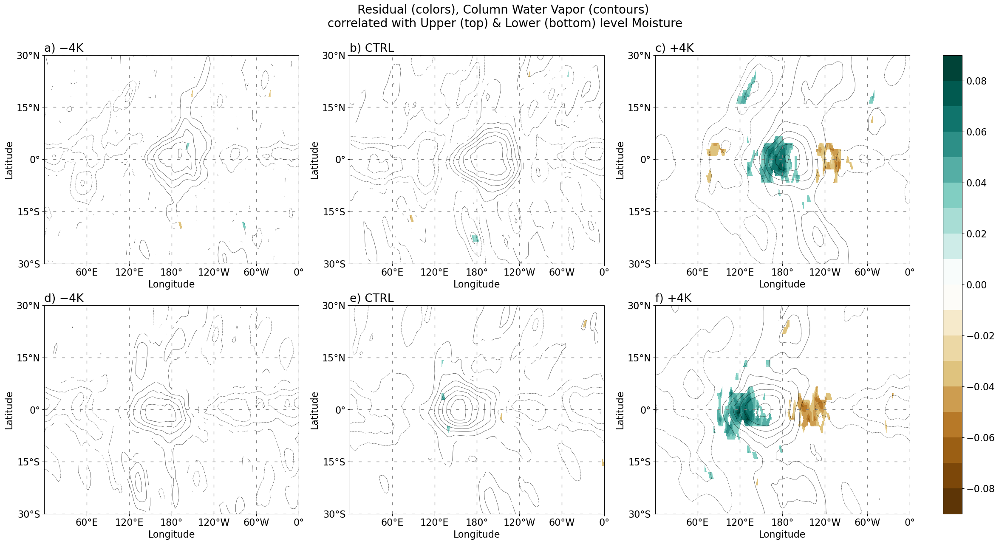

In [562]:
savefig = True
statistically_significant = True

longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

fontsize = 16
plt.style.use('default')
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(24, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios = [45, 1], wspace=0.075)
gs_main.update(left=0.05, right=0.95, bottom=0.05, top=0.95)
gs_axes = gs_main[0].subgridspec(2, 3)
gs_cbar = gs_main[1].subgridspec(1, 1)

axes = [[],[]]
axes[0].append(fig.add_subplot(gs_axes[0,0]))
axes[0].append(fig.add_subplot(gs_axes[0,1]))
axes[0].append(fig.add_subplot(gs_axes[0,2]))

axes[1].append(fig.add_subplot(gs_axes[1,0]))
axes[1].append(fig.add_subplot(gs_axes[1,1]))
axes[1].append(fig.add_subplot(gs_axes[1,2]))

# cbar_ax = fig.add_subplot(gs[:, 1])
# cbar_axes = []
cbar_axes = fig.add_subplot(gs_cbar[0])
# cbar_axes.append(fig.add_subplot(gs_cbar[1]))

contour_variable = 'Column Water Vapor'
# contourf_variable = 'Zonal Advection'
contourf_variable = 'Residual'
plev_to_plot = 'None'
# plev_to_plot = 850

if data_type == 'regressed':
    #### Contourf variable
    if 'Moisture Advection' in contourf_variable:
        ### Advection Variables
        contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
             (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(plev=plev_to_plot)
        contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

    else:
        contourf_data = multi_experiment_variables_regressed[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_regressed[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )

elif data_type == 'correlated':
    #### Contourf variable
    contourf_data = multi_experiment_variables_correlated[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_correlated[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_correlated['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_correlated['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )

if plev_to_plot != 'None':
    fig.suptitle(
        f"{plev_to_plot}-hPa {contourf_data.name} (colors), "
        + f"{(f'{plev_to_plot}-hPa ' if 'plev' in contour_data.dims else '')}{contour_data.name} (contours) "
        + (f" & {(f'{plev_to_plot}-hPa ' if 'plev' in contour_data.dims else '')}Winds (vectors) \n " if data_type == 'regressed' else "\n")
        + f"\n {('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower (bottom) level Moisture",
        y=1.05,
        fontsize=20
    )
else:
    fig.suptitle(
        f"{contourf_data.name} (colors), {contour_data.name} (contours)"
        + (f" & 850-hPa Winds (vectors)" if data_type == 'regressed' else "")
        + f"\n {('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower (bottom) level Moisture",
        y=1.05,
        fontsize=20
    )

letter = [['a', 'b', 'c'], ['d', 'e', 'f']]

for level_index, level in enumerate(multi_experiment_variables_regressed['Moisture'].level):
    for experiment_index, experiment in enumerate(experiments_list):

        axes[level_index][experiment_index].set_title(
            f"{letter[level_index][experiment_index]}) "
            + f"{experiments_array.sel(experiment=experiment)['name'].item()}",
            loc='left'
        )
        axes[level_index][experiment_index].set_facecolor('white')

        cdata, clon = cutil.add_cyclic_point(
            contourf_data.sel(experiment=experiment, level=level),
            coord=contourf_data.lon,
        )

        grand_max = contourf_data.max()
        grand_min = contourf_data.min()
        data_order = min(
            np.floor(np.log10(np.abs(grand_min))),
            np.floor(np.log10(np.abs(grand_max)))
        )

        if data_type == 'regressed':
            levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 11:
                levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+(10**data_order/2**index),
                10**data_order/2**index
                )
                index += 1
            levels -= np.min(np.abs(levels))
        else:
            magnitude_max = max(np.abs(grand_min), np.abs(grand_max))
            step=1/4
            increment = 0
            levels = np.arange(
                -round_out(magnitude_max, -data_order-increment),
                round_out(magnitude_max, -data_order-increment)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 15:
                levels = np.arange(
                    -round_out(magnitude_max, -data_order-increment, step=step),
                    round_out(magnitude_max, -data_order-increment, step=step)+10**data_order/2**index,
                    10**data_order/2**index
                )
                index += 1

            levels -= levels[np.argmin(np.abs(levels))]

        data_captured = (grand_max.values < np.max(levels))*(grand_min.values > np.min(levels))
        print(f"({level.values}, {experiment}) Colorbar captures all data? {data_captured}")
        cmap = modified_colormap('BrBG', 'white', 0.05, 0.05)
        cmap.set_bad('white')
        # Plot data
        im = axes[level_index][experiment_index].contourf(
            clon,
            contourf_data.lat,
            cdata,
            cmap=cmap,
            # levels=levels,
            levels = levels,
            norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values))),
            # extend='both'
        )

        # Add colorbar
        cbar = fig.colorbar(
            im,
            # cax=cbar_axes[index],
            cax=cbar_axes,
            label=(contourf_data.attrs['units'] if data_type == 'regressed' else ''),
            orientation="vertical",
        )
        # cbar.set_ticks()
        cbar.ax.tick_params(labelsize=fontsize)

        if contour_variable != 'None':
            cq, clon = cutil.add_cyclic_point(
                contour_data.sel(experiment=experiment, level=level),
                coord=contour_data.lon,
            )

            axes[level_index][experiment_index].contour(
                clon,
                contour_data.lat,
                cq,
                colors='black',
                levels=11,
                linewidths=0.5,
                alpha=0.75
            )

        if data_type == 'regressed':
            # Add cyclic point
            cu, clon = cutil.add_cyclic_point(
                zonal_wind_data.sel(experiment=experiment, level=level),
                coord=zonal_wind_data.lon,
            )

            cv, clon = cutil.add_cyclic_point(
                meridional_wind_data.sel(experiment=experiment, level=level),
                coord=meridional_wind_data.lon,
            )

            lon_skip = 4
            lat_skip = 2
            scale = 1
            quiv = axes[level_index][experiment_index].quiver(
                clon[::lon_skip],
                zonal_wind_data.lat[::lat_skip],
                cu[::lat_skip, ::lon_skip],
                cv[::lat_skip, ::lon_skip],
                # width=0.00125,
                scale_units='xy',
                angles='xy',
                scale=scale,
                width=0.0015,
                headwidth=6,
                headlength=10,
                minlength=2,
                zorder=10,
                color='black'
            )
            scale_label = 10
            axes[level_index][experiment_index].quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

        # if reference_point is not None:
        #     ax.plot(reference_point[0], reference_point[1].sel(experiment=experiment), marker='x', ms=14, color='k')

        for ax in axes[level_index]:
            # Axis parameters
            ax.set_aspect("auto")

            # if experiment == '-4K':
            #     rect = patches.Rectangle((0, -5), 300, 10, linewidth=1, edgecolor='k')

            ax.set_xlim(0, 360)
            x_ticks = np.arange(0, 360 + 60, 60)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
            ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
            ax.set_xlabel("Longitude")

            ax.set_ylim(-30, 30)
            y_ticks = np.arange(-30, 45, 15)
            ax.set_yticks(y_ticks)
            ax.set_yticklabels(tick_labeller(y_ticks, "lat"))
            ax.set_ylabel("Latitude")

            grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
            ax.grid(True, **grid_kwargs)

        # ax.add_patch(
        #     patches.Rectangle(
        #         (longitude_bounds[experiment][0], latitude_bounds[experiment][0]),
        #         longitude_bounds[experiment][1]-longitude_bounds[experiment][0],
        #         latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
        #         linewidth=1,
        #         edgecolor='k',
        #         facecolor='lightgray',
        #         alpha=0.25
        #     )
        # )

# fig.suptitle(
#     fig_title,
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025
# )

output_directory = "/glade/u/home/sressel/aquaplanet_analysis/output"
output_filename = (
    f"/mjo_{data_type}_"
    + f"{(f"{plev_to_plot}-hPa-" if plev_to_plot != 'None' else '')}{contourf_variable.lower().replace(" ", "_")}"
    + f"_{reference_variable}_longitude_latitude"
)
print(f"Output directory: {output_directory}")
print(f"Output file: {output_filename}")
if savefig:
    print(f"{f'Saving...':<{str_width-1}}", end="")
    plt.savefig(
        f"{output_directory}/{output_filename}.png",
        dpi=500,
        bbox_inches="tight"
    )
    print(rf"{'✔':>1}")
else:
    print(f"{f'Not Saving':<{str_width-1}}", end="")
    plt.show()

In [64]:
# savefig = False
# statistically_significant = False

# longitude_bounds = {}
# # longitude_bounds['-4K'] = (30, 260)
# # longitude_bounds['0K'] = (30, 300)
# # longitude_bounds['4K'] = (60, 300)

# latitude_bounds = {}
# latitude_bounds['-4K'] = (-5, 5)
# latitude_bounds['0K'] = (-10, 10)
# latitude_bounds['4K'] = (-15, 15)

# fontsize = 14
# plt.rcParams.update({'font.size':fontsize})
# fig = plt.figure(figsize=(8, 12))
# gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
# gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.1)

# axes = []
# axes.append(fig.add_subplot(gs[0,0]))
# axes.append(fig.add_subplot(gs[1,0]))
# axes.append(fig.add_subplot(gs[2,0]))
# cbar_ax = fig.add_subplot(gs[:, 1])
# # cbar_axes = []
# # cbar_axes.append(fig.add_subplot(gs[0,-1]))
# # cbar_axes.append(fig.add_subplot(gs[1,-1]))
# # cbar_axes.append(fig.add_subplot(gs[2,-1]))

# # contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed['Vertical Moisture Advection'].transpose("experiment", "lat", "lon", "plev")
# # contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

# contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed['Vertical Moisture Advection'].T
# contour_data = 1000*multi_experiment_variables_regressed['Moisture']

# meridional_mean_contourf_data_by_experiment = []
# meridional_mean_contour_data_by_experiment = []
# meridional_mean_zonal_wind_by_experiment = []
# meridional_mean_vertical_wind_by_experiment = []

# # Take a meridional mean over the specified domain
# if not statistically_significant:
#     for experiment in experiments_list:
#         meridional_mean_contourf_data_by_experiment.append(
#             contourf_data.sel(
#                 experiment=experiment
#             ).sel(
#                 lat=slice(*latitude_bounds[experiment])
#             ).mean(dim=['lat'])
#         )

#         meridional_mean_contour_data_by_experiment.append(
#             contour_data.sel(
#                 experiment=experiment
#             ).sel(
#                 lat=slice(*latitude_bounds[experiment])
#             ).mean(dim=['lat'])
#         )

#         meridional_mean_zonal_wind_by_experiment.append(
#             multi_experiment_variables_regressed['Zonal Wind'].sel(
#                 experiment=experiment
#             ).sel(
#                 lat=slice(*latitude_bounds[experiment])
#             ).mean(dim=['lat'])
#         )
#         meridional_mean_vertical_wind_by_experiment.append(
#             multi_experiment_variables_regressed['Vertical Wind'].sel(
#                 experiment=experiment
#             ).sel(
#                 lat=slice(*latitude_bounds[experiment])
#             ).mean(dim=['lat'])
#         )

# meridional_mean_contourf_data = xr.concat(
#     meridional_mean_contourf_data_by_experiment,
#     dim=experiments_array
# )

# meridional_mean_contour_data = xr.concat(
#     meridional_mean_contour_data_by_experiment,
#     dim=experiments_array
# )

# meridional_mean_zonal_wind = xr.concat(
#     meridional_mean_zonal_wind_by_experiment,
#     dim=experiments_array
# )
# meridional_mean_vertical_wind = xr.concat(
#     meridional_mean_vertical_wind_by_experiment,
#     dim=experiments_array
# )

# # rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind / meridional_mean_zonal_wind.std(dim=['plev', 'lon'])
# rescaled_meridional_mean_vertical_wind = meridional_mean_vertical_wind / meridional_mean_vertical_wind.std(dim=['plev', 'lon'])

# rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind
# rescaled_meridional_mean_vertical_wind = 500*meridional_mean_vertical_wind

# letter = ['a', 'b', 'c']

# fig.suptitle(f"{reference_variable} {contourf_data.name} (colors) \n& {contour_data.name} (contours)", y=1.025)

# for index, (ax, experiment) in enumerate(zip(axes, experiments_list)):

#     ax.set_title(
#         f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
#         + f" ({tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[0]}"
#         + f"-{tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[1]})",
#         loc='left'
#     )

#     # grand_max = meridional_mean_contourf_data.sel(experiment=experiment).max()
#     # grand_min = meridional_mean_contourf_data.sel(experiment=experiment).min()
#     grand_max = meridional_mean_contourf_data.max()
#     grand_min = meridional_mean_contourf_data.min()
#     if contourf_data.name == 'Moisture':
#         levels = np.arange(
#             round_out(grand_min, 0),
#             round_out(grand_max, 0)+0.25,
#             0.25
#         )
#     else:
#         levels = np.linspace(grand_min, grand_max, 21)

#     contourf_cdata, clon = cutil.add_cyclic_point(
#         meridional_mean_contourf_data.sel(experiment=experiment).T,
#         coord=meridional_mean_contourf_data.lon,
#     )

#     # Plot data
#     im = ax.contourf(
#         clon,
#         meridional_mean_contourf_data.plev,
#         contourf_cdata,
#         cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
#         levels=levels,
#         norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values)))
#         # **plotting_kwargs
#     )
#     # Add colorbar
#     cbar = fig.colorbar(
#         im,
#         # cax=cbar_axes[index],
#         cax=cbar_ax,
#         label=meridional_mean_contourf_data.attrs['units'],
#         orientation="vertical",
#     )
#     cbar.ax.tick_params(labelsize=fontsize)

#     contour_cdata, clon = cutil.add_cyclic_point(
#         meridional_mean_contour_data.sel(experiment=experiment).T,
#         coord=meridional_mean_contour_data.lon,
#     )

#     ax.contour(
#         clon,
#         meridional_mean_contour_data.plev,
#         contour_cdata,
#         colors='black',
#         levels=11,
#         linewidths=0.5,
#         alpha=0.75
#     )

#     # ax.contour(
#     #     clon,
#     #     meridional_mean_contourf_data.plev,
#     #     cdata,
#     #     colors='gray',
#     #     levels=levels[np.abs(levels) >= 0.1],
#     #     linewidths=1
#     # )

#     cu, clon = cutil.add_cyclic_point(
#         rescaled_meridional_mean_zonal_wind.sel(experiment=experiment).T,
#         coord=meridional_mean_zonal_wind.lon,
#     )

#     comega, clon = cutil.add_cyclic_point(
#         rescaled_meridional_mean_vertical_wind.sel(experiment=experiment).T,
#         coord=meridional_mean_vertical_wind.lon,
#     )

#     lon_spacing = 6
#     height_spacing = 3
#     scale = 5
#     quiv = ax.quiver(
#         clon[::lon_spacing],
#         meridional_mean_vertical_wind.plev[::height_spacing],
#         cu[::height_spacing, ::lon_spacing],
#         comega[::height_spacing, ::lon_spacing],
#         scale_units='xy',
#         angles='xy',
#         scale=scale,
#         width=0.0015,
#         headwidth=6,
#         headlength=10,
#         minlength=2,
#         zorder=10,
#         color='black',
#         alpha=0.7
#     )
#     scale_label = 5
#     ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

#     # Axis parameters
#     ax.set_aspect("auto")

#     ax.set_xlim(0, 360)
#     x_ticks = np.arange(0, 360 + 60, 60)
#     ax.set_xticks(x_ticks)
#     ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
#     ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
#     ax.set_xlabel("Longitude")

#     ax.set_ylim(100, 950)
#     ax.set_yticks(np.arange(100, 1000, 100))
#     ax.set_ylabel("Pressure (hPa)")
#     ax.invert_yaxis()

# if savefig:
#     plt.savefig(
#         f"/glade/u/home/sressel/aquaplanet_analysis/output/mjo_regression_{contourf_variable.name.lower.replace(" ", "_")}_longitude_height.png",
#         dpi=500,
#         bbox_inches="tight"
#     )
# else:
#     plt.show()

(upper, -4K) Colorbar captures all data? True
(upper, 0K) Colorbar captures all data? True
(upper, 4K) Colorbar captures all data? True
(lower, -4K) Colorbar captures all data? True
(lower, 0K) Colorbar captures all data? True
(lower, 4K) Colorbar captures all data? True
Output directory: /glade/u/home/sressel/aquaplanet_analysis/output
Output file: /mjo_correlated_zonal_moisture_advection_QU-QL_longitude_height
Saving...   ✔


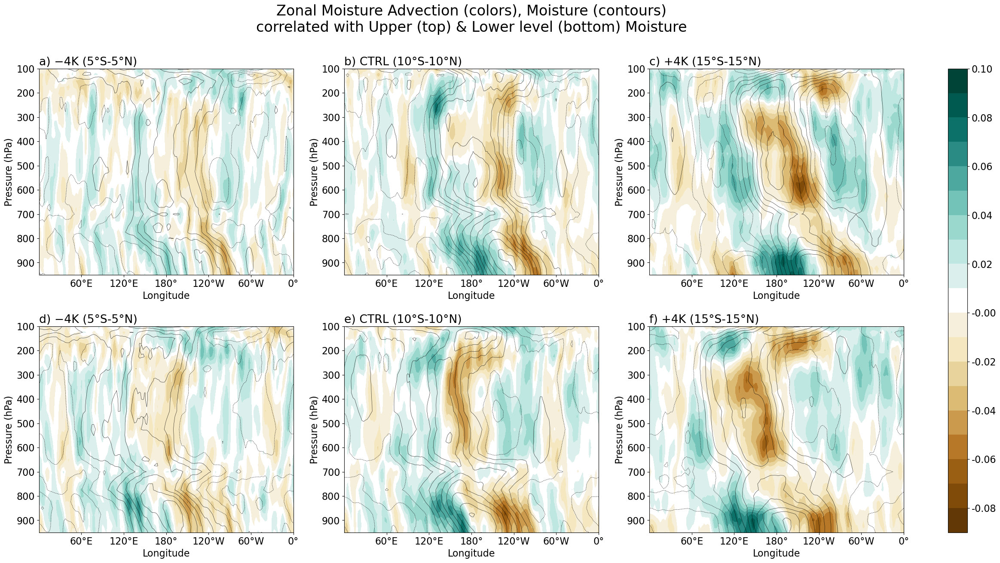

In [587]:
savefig = True
statistically_significant = False

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

fontsize = 16
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(24, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios = [45, 1], wspace=0.1)
gs_main.update(left=0.05, right=0.95, bottom=0.05, top=0.95)
gs_axes = gs_main[0].subgridspec(2, 3, hspace=0.25)
gs_cbar = gs_main[1].subgridspec(1, 1)

axes = [[],[]]
axes[0].append(fig.add_subplot(gs_axes[0,0]))
axes[0].append(fig.add_subplot(gs_axes[0,1]))
axes[0].append(fig.add_subplot(gs_axes[0,2]))

axes[1].append(fig.add_subplot(gs_axes[1,0]))
axes[1].append(fig.add_subplot(gs_axes[1,1]))
axes[1].append(fig.add_subplot(gs_axes[1,2]))

# cbar_ax = fig.add_subplot(gs[:, 1])
# cbar_axes = []
cbar_axes = fig.add_subplot(gs_cbar[0])
# cbar_axes.append(fig.add_subplot(gs_cbar[1]))

data_type = 'correlated'

contourf_variable = 'Zonal Moisture Advection'
contour_variable = 'Moisture'

if data_type == 'regressed':
     #### Contourf variable
    if 'Moisture Advection' in contourf_variable:
        ### Advection Variables
        contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
             (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')
        contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

    else:
        contourf_data = multi_experiment_variables_regressed[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = 1000*multi_experiment_variables_regressed[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).transpose('experiment', 'level', 'plev', 'lon', 'lat')
    vertical_wind_data = multi_experiment_variables_regressed['Vertical Wind'].where(
        (multi_experiment_significant_indices['Vertical Wind'] if statistically_significant else True)
    ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

elif data_type == 'correlated':
    contourf_data = multi_experiment_variables_correlated[contourf_variable].transpose('experiment', 'level', 'plev', 'lon', 'lat')
    contour_data = multi_experiment_variables_correlated[contour_variable].transpose('experiment', 'level', 'plev', 'lon', 'lat')

meridional_mean_contourf_data = xr.concat(
    [
        contourf_data.sel(
            experiment=experiment, lat=slice(*latitude_bounds[experiment])
        ).mean(dim=['lat'])
        for experiment
        in experiments_list
    ],
    dim=experiments_array
)
meridional_mean_contour_data = xr.concat(
    [
        contour_data.sel(
            experiment=experiment, lat=slice(*latitude_bounds[experiment])
        ).mean(dim=['lat'])
        for experiment
        in experiments_list
    ],
    dim=experiments_array
)

if data_type == 'regressed':
    meridional_mean_zonal_wind = xr.concat(
        [
            zonal_wind_data.sel(
                experiment=experiment, lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
            for experiment
            in experiments_list
        ],
        dim=experiments_array
    )
    meridional_mean_vertical_wind = xr.concat(
        [
            vertical_wind_data.sel(
                experiment=experiment, lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
            for experiment
            in experiments_list
        ],
        dim=experiments_array
    )

    # rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind / meridional_mean_zonal_wind.std(dim=['plev', 'lon'])
    rescaled_meridional_mean_vertical_wind = meridional_mean_vertical_wind / meridional_mean_vertical_wind.std(dim=['plev', 'lon'])

    rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind
    rescaled_meridional_mean_vertical_wind = 500*meridional_mean_vertical_wind

letter = [['a', 'b', 'c'], ['d', 'e', 'f']]


for level_index, level in enumerate(multi_experiment_variables_regressed['Moisture'].level):
    for experiment_index, experiment in enumerate(experiments_list):

        #### Title
        axes[level_index][experiment_index].set_title(
            f"{letter[level_index][experiment_index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
            + f" ({tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[0]}"
            + f"-{tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[1]})",
            loc='left'
        )

        #### Contourf Data
        grand_max = meridional_mean_contourf_data.max()
        grand_min = meridional_mean_contourf_data.min()
        data_order = min(
            np.floor(np.log10(np.abs(grand_min))),
            np.floor(np.log10(np.abs(grand_max)))
        )

        if data_type == 'regressed':
            levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 12:
                levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+(10**data_order/2**index),
                10**data_order/2**index
                )
                index += 1
            levels -= np.min(np.abs(levels))
        else:
            magnitude_max = max(np.abs(grand_min), np.abs(grand_max))
            step=1
            increment = -2
            levels = np.arange(
                -round_out(magnitude_max, -data_order-increment),
                round_out(magnitude_max, -data_order-increment)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 18:
                levels = np.arange(
                    -round_out(magnitude_max, 1, step=step),
                    round_out(magnitude_max, 1, step=step)+10**data_order/2**index,
                    10**data_order/2**index
                )
                index += 1

            # levels -= levels[np.argmin(np.abs(levels))]

        data_captured = (grand_max.values < np.max(levels))*(grand_min.values > np.min(levels))
        print(f"({level.values}, {experiment}) Colorbar captures all data? {data_captured}")

        contourf_cdata, clon = cutil.add_cyclic_point(
            meridional_mean_contourf_data.sel(experiment=experiment, level=level),
            coord=meridional_mean_contourf_data.lon,
        )

        im = axes[level_index][experiment_index].contourf(
            clon,
            meridional_mean_contourf_data.plev,
            contourf_cdata,
            cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
            levels=levels,
            norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values)))
        )

        cbar = fig.colorbar(
            im,
            # cax=cbar_axes[index],
            cax=cbar_axes,
            label=(meridional_mean_contourf_data.attrs['units'] if data_type == 'regressed' else ''),
            orientation="vertical",
        )
        cbar.ax.tick_params(labelsize=fontsize)
        cbar.set_ticklabels([f"{level:0.2f}" for level in im.levels])

        #### Contour Data
        contour_cdata, clon = cutil.add_cyclic_point(
            meridional_mean_contour_data.sel(experiment=experiment, level=level),
            coord=meridional_mean_contour_data.lon,
        )

        axes[level_index][experiment_index].contour(
            clon,
            meridional_mean_contour_data.plev,
            contour_cdata,
            colors='black',
            levels=11,
            # levels = im.levels[::2],
            linewidths=0.5,
            alpha=0.8
        )

        #### Quiver Data
        if data_type == 'regressed':
            cu, clon = cutil.add_cyclic_point(
                rescaled_meridional_mean_zonal_wind.sel(experiment=experiment, level=level),
                coord=meridional_mean_zonal_wind.lon,
            )

            comega, clon = cutil.add_cyclic_point(
                rescaled_meridional_mean_vertical_wind.sel(experiment=experiment, level=level),
                coord=meridional_mean_vertical_wind.lon,
            )

            lon_spacing = 6
            height_spacing = 2
            scale = 1.5
            quiv = axes[level_index][experiment_index].quiver(
                clon[::lon_spacing],
                meridional_mean_vertical_wind.plev[::height_spacing],
                cu[::height_spacing, ::lon_spacing],
                comega[::height_spacing, ::lon_spacing],
                scale_units='xy',
                angles='xy',
                scale=scale,
                width=0.0015,
                headwidth=6,
                headlength=10,
                minlength=2,
                zorder=10,
                color='black',
                alpha=0.7
            )
            scale_label = 20
            axes[level_index][experiment_index].quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')


    #### Configure axes
    for ax in axes[level_index]:
        # Axis parameters
        ax.set_aspect("auto")

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 60, 60)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
        ax.set_xlabel("Longitude")

        ax.set_ylim(100, 950)
        ax.set_yticks(np.arange(100, 1000, 100))
        ax.set_ylabel("Pressure (hPa)")
        ax.invert_yaxis()

#### Set suptitle
fig.suptitle(
    (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f" & Winds (vectors) \n " if data_type == 'regressed' else "\n")
    + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower level (bottom) Moisture"),
    x=(axes[0][1].get_position().x0 + axes[0][1].get_position().x1)/2,
    ha='center',
    y=1.075,
    fontsize=24
)

output_directory = "/glade/u/home/sressel/aquaplanet_analysis/output"
output_filename = (
    f"/mjo_{data_type}_"
    + f"{contourf_variable.lower().replace(" ", "_")}"
    + f"_{reference_variable}_longitude_height"
)

print(f"Output directory: {output_directory}")
print(f"Output file: {output_filename}")
#### Save output
if savefig:
    print(f"{f'Saving...':<12}", end="")
    plt.savefig(
        f"{output_directory}/{output_filename}.png",
        dpi=500,
        bbox_inches="tight"
    )
    print(rf"{'✔':>1}")
else:
    print("Not saving")
    plt.show()

In [588]:
print(np.min(levels), np.max(levels))
print(grand_min.values, grand_max.values)
levels
# magnitude_max

-0.09430000000000001 0.09569999999999988
-0.07985667977175019 0.0942591749492539


array([-0.0943, -0.0843, -0.0743, -0.0643, -0.0543, -0.0443, -0.0343,
       -0.0243, -0.0143, -0.0043,  0.0057,  0.0157,  0.0257,  0.0357,
        0.0457,  0.0557,  0.0657,  0.0757,  0.0857,  0.0957])

In [29]:
variables_to_regress = {
    'Moisture': multi_experiment_budget_variables['Moisture'],
    'Moisture Tendency': multi_experiment_budget_variables['Moisture Tendency'],
    'Precipitation': multi_experiment_budget_variables['Precipitation'],
    'Evaporation': multi_experiment_budget_variables['Evaporation'],
    'Residual': multi_experiment_budget_variables['Residual'],
    'Zonal Advection': multi_experiment_variables_subset['Zonal Moisture Advection'],
    'Meridional Advection': multi_experiment_variables_subset['Meridional Moisture Advection'],
    'Vertical Advection': multi_experiment_variables_subset['Vertical Moisture Advection'],
}

# Initialize the dictionary to hold the regressed values
multi_experiment_variables_regressed_moisture = {}
significant_regression_indices_moisture = {}

print(f"{'Regressions':^{str_width}}")
print(f"{f'Regression Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

for reference_timeseries in [multi_experiment_lower_level_moisture, multi_experiment_upper_level_moisture]:
    print(reference_timeseries.name)
    # Concatenate along the 'experiment' dimension
    standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

    N = len(standardized_reference_timeseries.time)
    t_critical = t.ppf(0.95, df=N-2)

    significant_regression_indices = {}

    multi_experiment_variables_regressed_moisture[reference_timeseries.name] = {}
    significant_regression_indices_moisture[reference_timeseries.name] = {}

    for index, (variable_name, variable_data) in enumerate(variables_to_regress.items()):

        print(f'{f"({index+1}/{len(variables_to_regress)}) {variable_name}...":<{str_width-1}}', end="")

        # Remove the time mean of the variables to be regressed
        variable_data_anomalies = standardize_data(variable_data, unit_variance=False, dim='time')

        # Regress the variable anomalies onto the reference timeseries
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] = xr.dot(
            standardized_reference_timeseries,
            variable_data_anomalies,
            dim='time'
        ) / len(standardized_reference_timeseries.time)
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name].attrs = variable_data_anomalies.attrs
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name].name = variable_name

        # Calculate the statstical significance of the regression coefficients
        predicted_value = multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] * standardized_reference_timeseries
        residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
        residual_variance = residual_sum_of_squares / (N - 2)
        standard_error_slope = np.sqrt(residual_variance / (N - 1))
        t_statistic = multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] / standard_error_slope
        significant_regression_indices_moisture[reference_timeseries.name][variable_name] = np.abs(t_statistic) > t_critical

        print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

              Regressions               
Regression Variable: Lower Level Moisture
Lower Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Precipitation...                 ✔
(4/8) Evaporation...                   ✔
(5/8) Residual...                      ✔
(6/8) Zonal Advection...               ✔
(7/8) Meridional Advection...          ✔
(8/8) Vertical Advection...            ✔
Upper Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Precipitation...                 ✔
(4/8) Evaporation...                   ✔
(5/8) Residual...                      ✔
(6/8) Zonal Advection...               ✔
(7/8) Meridional Advection...          ✔
(8/8) Vertical Advection...            ✔
Finished


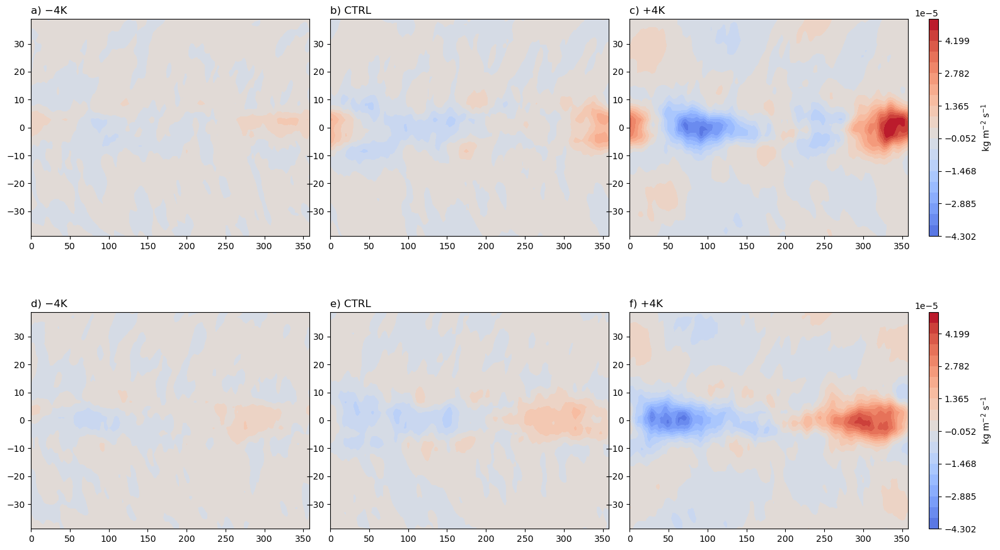

In [75]:
variable_to_plot = 'Precipitation'

fontsize=18
plt.rcParams.update({'font.size':fontsize})
plt.style.use('default')
fig = plt.figure(figsize=(16, 9))
gs = GridSpec(2, 4, width_ratios=[30,30,30,1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.1)

upper_axes = []
upper_axes.append(fig.add_subplot(gs[0,0]))
upper_axes.append(fig.add_subplot(gs[0,1]))
upper_axes.append(fig.add_subplot(gs[0,2]))
lower_axes = []
lower_axes.append(fig.add_subplot(gs[1,0]))
lower_axes.append(fig.add_subplot(gs[1,1]))
lower_axes.append(fig.add_subplot(gs[1,2]))

cbar_axes = []
cbar_axes.append(fig.add_subplot(gs[0, -1]))
cbar_axes.append(fig.add_subplot(gs[1, -1]))

grand_min = min(
    multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].min(),
    multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].min()
)
grand_max = max(
    multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].max(),
    multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].max()
)

# lower_grand_min = multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].min()
# lower_grand_max = multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].max()

letters = ['a', 'b', 'c', 'd', 'e', 'f']

for index, experiment in enumerate(experiments_list):
    upper_axes[index].set_title(f"{letters[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}", loc='left')
    im = upper_axes[index].contourf(
        multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].lon,
        multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].lat,
        # multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].where(
        #     significant_regression_indices_moisture['Upper Level Moisture'][variable_to_plot]
        # ).sel(plev=850).sel(experiment=experiment),
        multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].sel(experiment=experiment),
        # cmap=modified_colormap('coolwarm', 'white', 0.05, 0.05),
        cmap='coolwarm',
        levels=np.linspace(grand_min, grand_max, 21),
        norm=mcolors.CenteredNorm(vcenter=0)
    )
    cbar = fig.colorbar(im, cax=cbar_axes[0], orientation='vertical')
    cbar.set_label(f"{multi_experiment_variables_regressed_moisture['Upper Level Moisture'][variable_to_plot].attrs['units']}")

    lower_axes[index].set_title(f"{letters[3+index]}) {experiments_array.sel(experiment=experiment)['name'].item()}", loc='left')
    im = lower_axes[index].contourf(
        multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].lon,
        multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].lat,
        # multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].where(
        #     significant_regression_indices_moisture['Lower Level Moisture'][variable_to_plot]
        # ).sel(plev=850).sel(experiment=experiment),
        multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].sel(experiment=experiment),
        # cmap=modified_colormap('coolwarm', 'white', 0.05, 0.05),
        cmap='coolwarm',
        levels=np.linspace(grand_min, grand_max, 21),
        norm=mcolors.CenteredNorm(vcenter=0)
    )
    cbar = fig.colorbar(im, cax=cbar_axes[1], orientation='vertical')
    cbar.set_label(f"{multi_experiment_variables_regressed_moisture['Lower Level Moisture'][variable_to_plot].attrs['units']}")

plt.show()

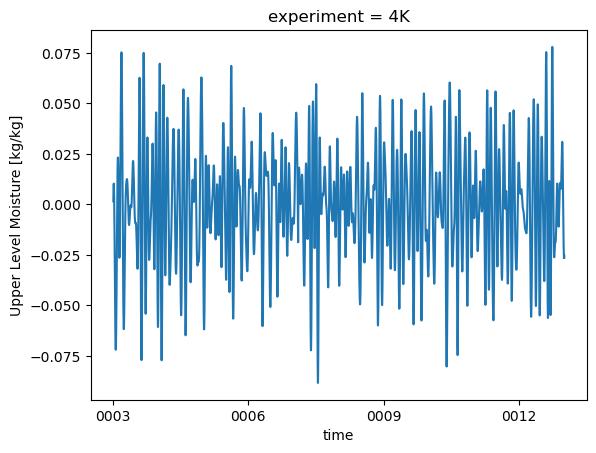

In [73]:
reference_timeseries.sel(experiment='4K').plot()

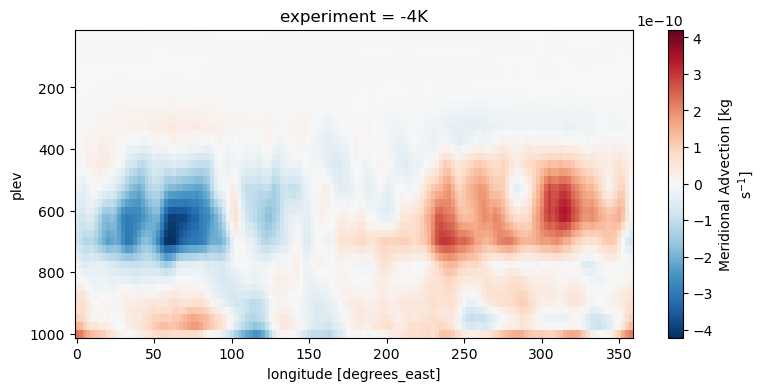

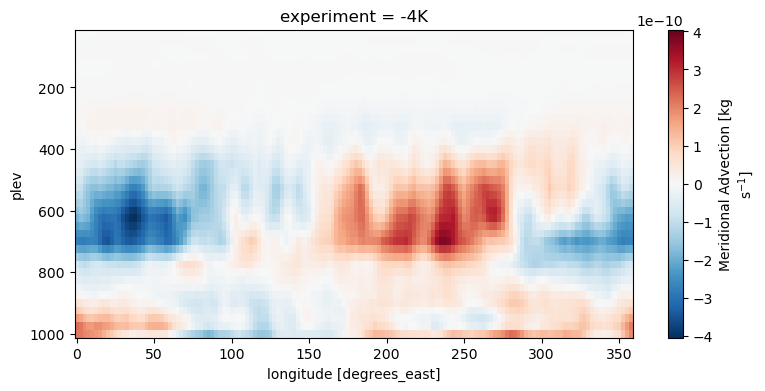

In [76]:
plt.figure(figsize=(9,4))
multi_experiment_variables_regressed_moisture['Upper Level Moisture']['Meridional Advection'].sel(experiment='-4K', lat=slice(-10, 10)).mean(dim='lat').plot(y='plev')
plt.gca().invert_yaxis()
plt.figure(figsize=(9,4))
multi_experiment_variables_regressed_moisture['Lower Level Moisture']['Meridional Advection'].sel(experiment='-4K', lat=slice(-10, 10)).mean(dim='lat').plot(y='plev')
plt.gca().invert_yaxis()

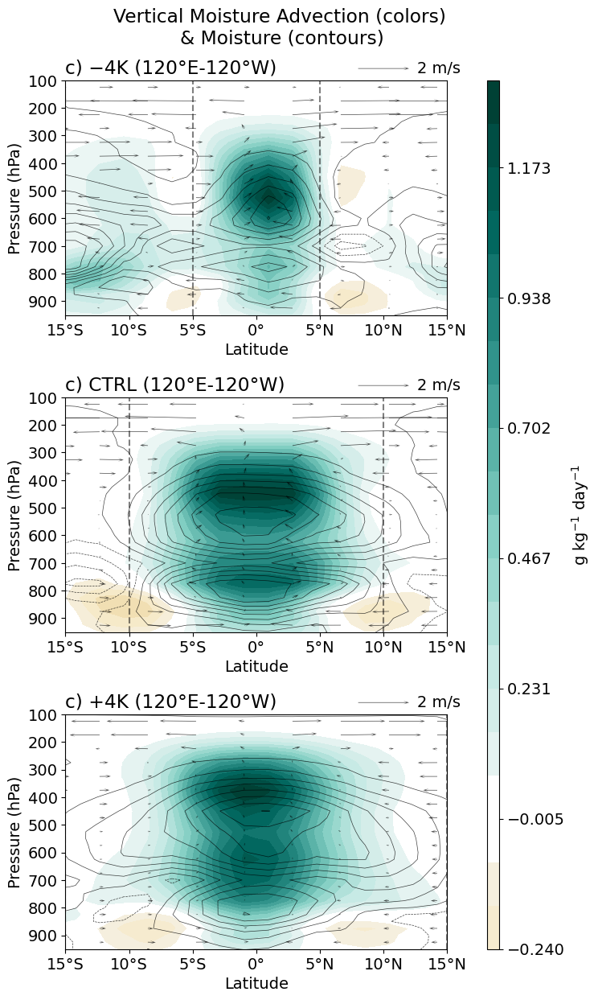

In [48]:
longitude_bounds = {}
# longitude_bounds['-4K'] = (30, 260)
# longitude_bounds['0K'] = (30, 300)
# longitude_bounds['4K'] = (60, 300)
# longitude_bounds['-4K'] = (120, 360-120)
# longitude_bounds['0K'] = (120, 360-120)
# longitude_bounds['4K'] = (120, 360-120)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

fontsize = 14
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(6, 12))
gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.2)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cb_ax = fig.add_subplot(gs[:, 1])


contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed['Vertical Moisture Advection']
contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

contour_data = multi_experiment_variables_regressed['Moisture'].T

meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].T
vertical_wind_data = 100*multi_experiment_variables_regressed['Vertical Wind'].T

letters = ['a', 'b', 'c']

fig.suptitle(f"{contourf_data.name} (colors) \n& {contour_data.name} (contours)", y=1.025)

for ax, experiment in zip(axes, experiments_list):

    # ax.set_title(f"{experiments_array.sel(experiment=experiment)['name'].item()}")
    ax.set_title(
        f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
        + f" ({tick_labeller(longitude_bounds[experiment], 'lon', precision=0)[0]}"
        + f"-{tick_labeller(longitude_bounds[experiment], 'lon', precision=0)[1]})",
        loc='left'
    )

    zonal_mean_contourf_data = contourf_data.sel(
        lon=slice(*longitude_bounds[experiment])
    ).mean(dim='lon').sel(experiment=experiment)

    # grand_max = meridional_mean_contourf_data.sel(experiment=experiment).max()
    # grand_min = meridional_mean_contourf_data.sel(experiment=experiment).min()
    grand_max = zonal_mean_contourf_data.max()
    grand_min = zonal_mean_contourf_data.min()
    if zonal_mean_contourf_data.name == 'Moisture':
        levels = np.arange(
            round_out(grand_min, 0),
            round_out(grand_max, 0)+0.25,
            0.25
        )
    else:
        levels = np.linspace(grand_min, grand_max, 21)

    # Plot data
    im = ax.contourf(
        zonal_mean_contourf_data.lat,
        zonal_mean_contourf_data.plev,
        zonal_mean_contourf_data,
        cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
        levels=levels,
        norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values)))
        # **plotting_kwargs
    )

    # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cb_ax,
        label=contourf_data.attrs['units'],
        orientation="vertical",
    )
    # cbar.set_ticks()
    cbar.ax.tick_params(labelsize=fontsize)

    zonal_mean_contour_data = contour_data.sel(
        lon=slice(*longitude_bounds[experiment])
    ).mean(dim='lon').sel(experiment=experiment)

    ax.contour(
        zonal_mean_contour_data.lat,
        zonal_mean_contour_data.plev,
        zonal_mean_contour_data,
        colors='black',
        levels=11,
        linewidths=0.5,
        alpha=0.75
    )

    zonal_mean_meridional_wind_data = meridional_wind_data.sel(
        lon=slice(*longitude_bounds[experiment])
    ).mean(dim='lon').sel(experiment=experiment)

    zonal_mean_vertical_wind_data = vertical_wind_data.sel(
        lon=slice(*longitude_bounds[experiment])
    ).mean(dim='lon').sel(experiment=experiment)

    lat_skip = 2
    lev_skip = 2
    scale = 0.5
    quiv = ax.quiver(
        zonal_mean_meridional_wind_data.lat[::lat_skip],
        zonal_mean_vertical_wind_data.plev[::lev_skip],
        zonal_mean_meridional_wind_data[::lev_skip, ::lat_skip],
        zonal_mean_vertical_wind_data[::lev_skip, ::lat_skip],
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black',
        alpha=0.7
    )
    # scale_label = 0.25
    scale_label = 2
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # if reference_point is not None:
    #     ax.plot(reference_point[0], reference_point[1].sel(experiment=experiment), marker='x', ms=14, color='k')

    # Axis parameters
    ax.set_aspect("auto")

    ax.set_ylim(100, 950)
    ax.set_yticks(np.arange(100, 1000, 100))
    ax.set_ylabel("Pressure (hPa)")
    ax.invert_yaxis()

    ax.set_xlim(-15, 15)
    x_ticks = np.arange(-15, 15+5, 5)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lat", precision=0))
    ax.set_xlabel("Latitude")

    ax.axvline(latitude_bounds[experiment][0], ls='--', color='k', alpha=0.5)
    ax.axvline(latitude_bounds[experiment][1], ls='--', color='k', alpha=0.5)

if savefig:
    plt.savefig(
        f"/glade/u/home/sressel/aquaplanet_analysis/output/mjo_regression_{contourf_variable.name.lower.replace(" ", "_")}_latitude_height.png",
        dpi=500,
        bbox_inches="tight"
    )
else:
    plt.show()

In [ ]:
# output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
# savefig=False

# plt.style.use("default")
# plt.rcParams.update({"font.size": 24})

# variables_to_plot = [
#     multi_experiment_variables_regressed['precipitation'.title()],
#     multi_experiment_variables_regressed['outgoing longwave radiation'.title()],
#     multi_experiment_variables_regressed['zonal wind'.title()].sel(plev=200),
#     multi_experiment_variables_regressed['zonal wind'.title()].sel(plev=850),
#     multi_experiment_variables_regressed['vertical wind'.title()].sel(plev=500),
#     # multi_experiment_variables_regressed['column temperature'.title()],
#     # multi_experiment_variables_regressed['column water vapor'.title()],
#     multi_experiment_variables_regressed['moist static energy'.title()].sel(plev=850),
#     # multi_experiment_variables_regressed['column longwave heating'.title()],
#     # multi_experiment_variables_regressed['column shortwave heating'.title()],
#     multi_experiment_variables_regressed['latent heat flux'.title()],
#     multi_experiment_variables_regressed['sensible heat flux'.title()],
# ]

# # print(f'{f"Regressions onto PC {regression_PC}":^{str_width}}')
# print(f"{'='*str_width}")
# for variable_data in variables_to_plot:
#     grand_max = variable_data.max()
#     grand_min = variable_data.min()

#     fig = plt.figure(figsize=(16, 12))
#     gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
#     gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.2, wspace=0.1)

#     axes = []
#     axes.append(fig.add_subplot(gs[0,0]))
#     axes.append(fig.add_subplot(gs[1,0]))
#     axes.append(fig.add_subplot(gs[2,0]))
#     cb_ax = fig.add_subplot(gs[:, 1])

#     for ax, experiment in zip(axes, experiments_list):
#         ax.set_title(f"{experiment}")

#         # Add cyclic point
#         cdata, clon = cutil.add_cyclic_point(
#             variable_data.sel(experiment=experiment),
#             coord=variable_data.lon,
#         )

#         # Plot data
#         im = ax.contourf(
#             clon,
#             variable_data.lat,
#             cdata,
#             levels=np.linspace(grand_min, grand_max, 21),
#             norm=mcolors.CenteredNorm(vcenter=0),
#             **{k: copy.deepcopy(v) for k, v in {
#                 # "norm": plotting_attributes[variable_data.name].get("norm"),
#                 "cmap": plotting_attributes[variable_data.name].get("d_cmap")
#             }.items() if v is not None}
#         )

#         # Add colorbar
#         cbar = fig.colorbar(
#             im,
#             cax=cb_ax,
#             label=variable_data.attrs['units'],
#             orientation="vertical",
#         )
#         cbar.ax.tick_params(labelsize=20)

#         ax.plot(reference_longitude, reference_latitude.sel(experiment=experiment), marker='x', color='k', ms=14)

#         # Axis parameters
#         ax.set_aspect("equal")

#         ax.set_xlim(0, 360)
#         x_ticks = np.arange(0, 360 + 60, 60)
#         ax.set_xticks(x_ticks)
#         ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
#         ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
#         ax.set_xlabel("Longitude")

#         ax.set_ylim(-30, 30)
#         y_ticks = np.arange(-30, 45, 15)
#         ax.set_yticks(y_ticks)
#         ax.set_yticklabels(tick_labeller(y_ticks, "lat"))
#         ax.set_ylabel("Latitude")

#         grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
#         ax.grid(True, **grid_kwargs)

#     fig.suptitle(
#         (
#             f"{(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')}"
#             + f" {variable_data.name} regressed onto \n{regression_variable}{(regression_index+1 if regression_variable == 'PCs' else '')}"
#         ),
#         x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#         ha='center',
#         y=1.025
#     )

#     if not savefig:
#         plt.show()
#     else:
#         save_string = (
#             f"multi-experiment_{variable_data.attrs['file_id']}"
#           + f"{((str(variable_data.plev.values)) if 'plev' in variable_data.coords else '')}"
#           + f"_regressed-on-{regression_variable.replace(' ', '-')}{(regression_index+1 if regression_variable == 'PCs' else '')}"
#           + f".png"
#             )
#         print(
#             f"Saving {(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')} {variable_data.name} plot as {save_string}"
#         )
#         plt.savefig(
#             f"{output_directory}/regressions/latitude-longitude/{save_string}",
#             dpi=500,
#             bbox_inches="tight",
#         )

# print(f"{'='*40}")
# print("Finished")

## Longitude-Height

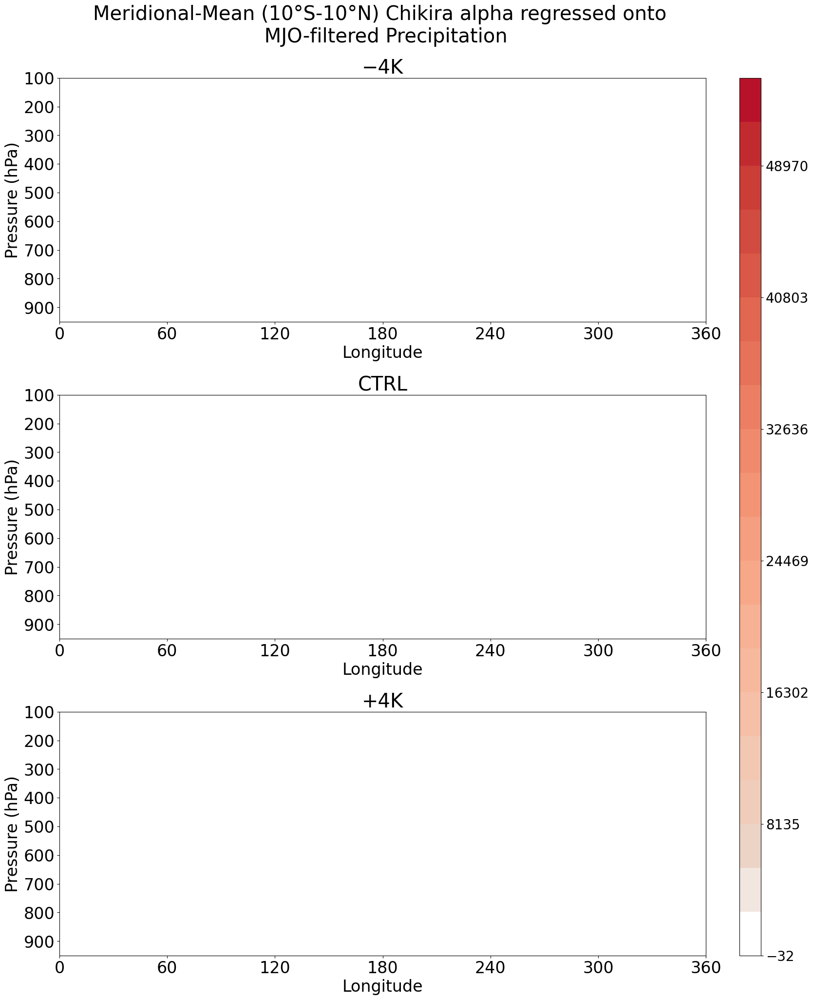

In [14]:
output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"

if 'moisture' in multi_experiment_variables_regressed:
    scaled_moisture = 1000*multi_experiment_variables_regressed['moisture'.title()]
    scaled_moisture.attrs['units'] = 'g/kg'

variables_to_plot = [
    # multi_experiment_variables_regressed['Zonal Wind'].T,
    # multi_experiment_variables_regressed['meridional wind'.title()],
    # multi_experiment_variables_regressed['vertical wind'.title()],
    # multi_experiment_variables_regressed['temperature'.title()],
    # scaled_moisture.T,
    # multi_experiment_variables_regressed['geopotential height'.title()],
    # multi_experiment_variables_regressed['moist static energy'.title()],
    # multi_experiment_variables_regressed['longwave heating rate'.title()],
    # multi_experiment_variables_regressed['shortwave heating rate'.title()],
    multi_experiment_variables_regressed['Chikira alpha']#.where(np.abs(multi_experiment_variables_regressed['Chikira alpha']) <= 15)
]

meridional_mean_region = slice(-10, 10)
for variable_data in variables_to_plot:
    multi_experiment_lon_height(
        variable_data,
        savefig=True,
        filename=(
            f"{output_directory}/regressions/longitude-height/"
            + f"multi-experiment_meridional-mean-{tick_labeller([meridional_mean_region.start], 'lat', False)[0]}"
            + f"-{tick_labeller([meridional_mean_region.stop], 'lat', False)[0]}"
            + f"_{variable_data.attrs['file_id']}"
            + f"_regressed-on-{reference_variable.replace(' ', '-')}{(regression_index+1 if reference_variable == 'PCs' else '')}"
            + f".png"
        ),
        fig_title = (
            f"Meridional-Mean"
            + f" ({tick_labeller([meridional_mean_region.start], 'lat')[0]}"
            + f"-{tick_labeller([meridional_mean_region.stop], 'lat')[0]})"
            # + f" {variable_data.name} regressed onto \n{regression_variable}{(regression_index+1 if regression_variable == 'PCs' else '')}"
            + f" {variable_data.name} regressed onto \n {regression_wave_type}-filtered Precipitation"
        ),
        cmap='variable_d',
        norm='zero-centered',
    )

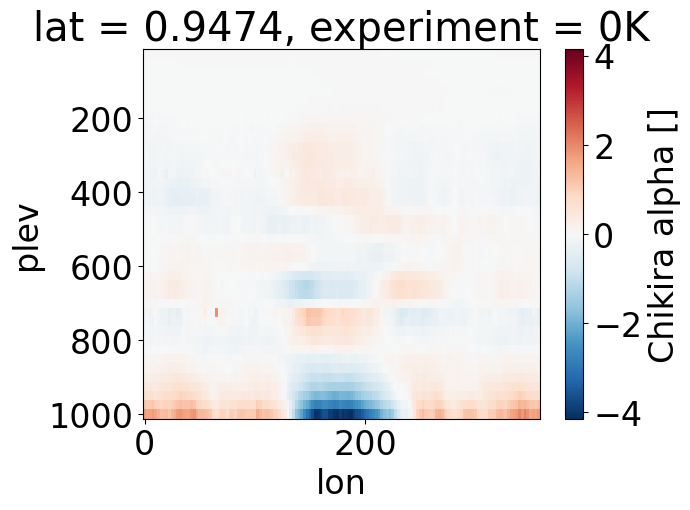

In [28]:
multi_experiment_variables_regressed['Chikira alpha'].sel(experiment='0K').sel(lat=0, method='nearest').plot()
plt.gca().invert_yaxis()

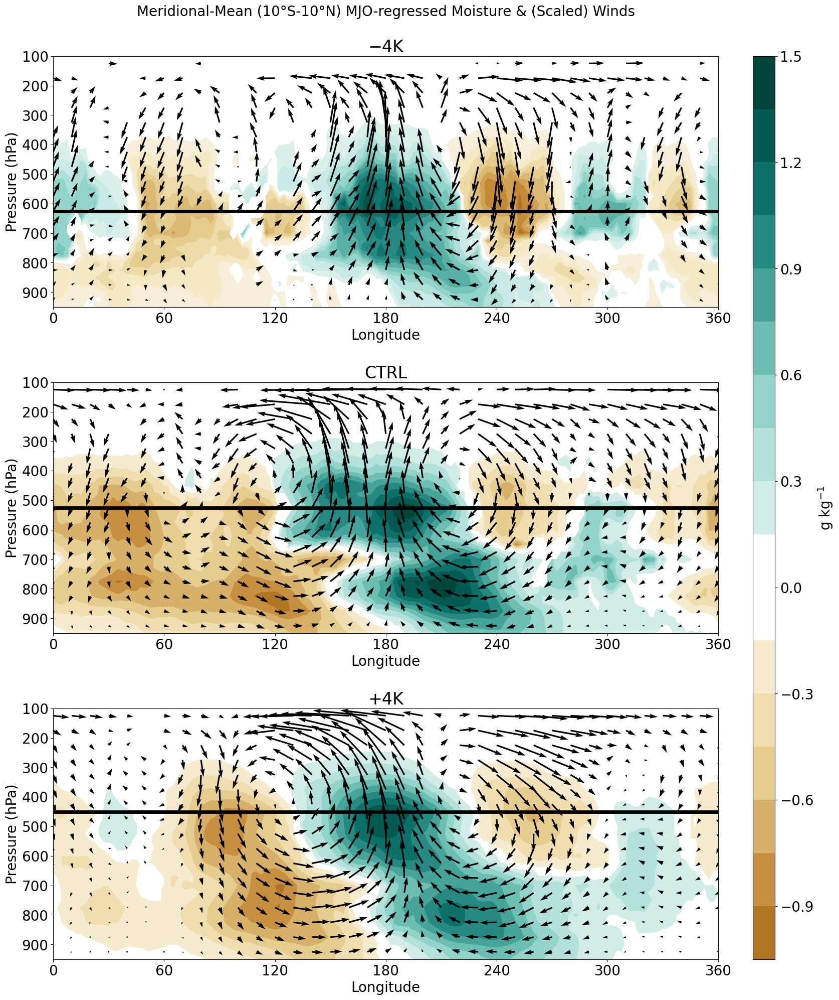

In [41]:
lon_spacing = 4
height_spacing = 2
plt.style.use("default")
plt.rcParams['mathtext.fontset'] = 'dejavusans'
plt.rcParams.update({"font.size": 20})

fig = plt.figure(figsize=(16, 20))
gs = GridSpec(3, 2, width_ratios=[30, 1], height_ratios=[1, 1, 1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.1)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])
for index, experiment in enumerate(experiments_list):

    scaled_moisture = 1000*multi_experiment_variables_regressed['Moisture']
    scaled_moisture.attrs['units'] = r"g kg$^{-1}$"
    meridional_mean_variable_data = scaled_moisture.where(
        multi_experiment_significant_indices['Moisture']
    ).sel(lat=slice(-10,10)).mean(dim=['lat'])

    meridional_mean_zonal_wind = multi_experiment_variables_regressed['Zonal Wind'].where(
        multi_experiment_significant_indices['Zonal Wind']
    ).sel(lat=slice(-10,10)).mean(dim=['lat'])
    # meridional_mean_zonal_wind /= np.std(np.abs(meridional_mean_zonal_wind))

    meridional_mean_vertical_wind = multi_experiment_variables_regressed['Vertical Wind'].where(
        multi_experiment_significant_indices['Vertical Wind']
    ).sel(lat=slice(-10,10)).mean(dim=['lat'])
    # meridional_mean_vertical_wind *= (40000/18)
    # meridional_mean_vertical_wind /= np.std(np.abs(meridional_mean_vertical_wind))
    meridional_mean_vertical_wind *= 100

    axes[index].set_title(f"{experiments_array.sel(experiment=experiment)['name'].item()}")

     # Add cyclic point
    cdata, clon = cutil.add_cyclic_point(
        meridional_mean_variable_data.sel(experiment=experiment).T,
        coord=meridional_mean_variable_data.lon,
    )

    im = axes[index].contourf(
        clon,
        meridional_mean_variable_data.plev,
        cdata,
        cmap=mjo.modified_colormap('BrBG', 'white', 0.05, 0.05),
        levels=21,
        norm=mcolors.CenteredNorm(vcenter=0)
    )

    axes[index].axhline(
        y=meridional_mean_variable_data.sel(experiment=experiment).sel(lon=180).idxmax('plev'),
        ls='-',
        lw=5,
        color='black'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cbar_ax,
        label=meridional_mean_variable_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=20)

    cu, clon = cutil.add_cyclic_point(
        meridional_mean_zonal_wind.sel(experiment=experiment).T,
        coord=meridional_mean_zonal_wind.lon,
    )

    comega, clon = cutil.add_cyclic_point(
        meridional_mean_vertical_wind.sel(experiment=experiment).T,
        coord=meridional_mean_vertical_wind.lon,
    )

    axes[index].quiver(
        clon[::lon_spacing],
        meridional_mean_vertical_wind.plev[::height_spacing],
        cu[::height_spacing, ::lon_spacing],
        -comega[::height_spacing, ::lon_spacing],
        # scale = 250
    )
    # axes[index].invert_yaxis()
    # Axis parameters
    axes[index].set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    axes[index].set_xticks(x_ticks)
    # ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
    # ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    axes[index].set_xlabel("Longitude")

    axes[index].set_ylim(100, 950)
    axes[index].set_yticks(np.arange(100, 1000, 100))
    axes[index].set_ylabel("Pressure (hPa)")
    axes[index].invert_yaxis()
    axes[index].set_aspect('auto')

fig.suptitle(
    'Meridional-Mean (10°S-10°N) MJO-regressed Moisture & (Scaled) Winds',
    x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
    ha='center',
    y=1.001,
    fontsize=20
)

plt.show()

In [ ]:
lat_spacing = 1
height_spacing = 2
plt.style.use("default")
plt.rcParams.update({"font.size": 16})

fig = plt.figure(figsize=(16, 20))
gs = GridSpec(3, 2, width_ratios=[30, 1], height_ratios=[1, 1, 1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.1)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])
for index, experiment in enumerate(experiments_list):

    zonal_mean_variable_data = multi_experiment_variables_regressed['Moisture'].where(
        multi_experiment_significant_indices['Moisture']
    ).mean(dim='lon')

    zonal_mean_zonal_wind = multi_experiment_variables_regressed['Zonal Wind'].where(
        multi_experiment_significant_indices['Zonal Wind']
    ).mean(dim='lon')
    zonal_mean_zonal_wind /= np.nanmax(np.abs(zonal_mean_zonal_wind))

    zonal_mean_vertical_wind = multi_experiment_variables_regressed['Vertical Wind'].where(
        multi_experiment_significant_indices['Vertical Wind']
    ).mean(dim='lon')
    zonal_mean_vertical_wind /= np.nanmax(np.abs(zonal_mean_vertical_wind))

    axes[index].set_title(f"{experiments_array.sel(experiment=experiment)['name'].item()}")

    im = axes[index].contourf(
        zonal_mean_variable_data.lat,
        zonal_mean_variable_data.plev,
        zonal_mean_variable_data.sel(experiment=experiment).T,
        cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
        levels=21,
        norm=mcolors.CenteredNorm(vcenter=0)
    )
            # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cbar_ax,
        label=zonal_mean_variable_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=20)

    axes[index].quiver(
        zonal_mean_zonal_wind.lat[::lat_spacing],
        zonal_mean_vertical_wind.plev[::height_spacing],
        zonal_mean_zonal_wind.sel(experiment=experiment).T[::height_spacing, ::lat_spacing],
        -zonal_mean_vertical_wind.sel(experiment=experiment).T[::height_spacing, ::lat_spacing],
    )
    # axes[index].invert_yaxis()
    # Axis parameters
    axes[index].set_xlim(-30, 30)
    x_ticks = np.arange(-30, 30 + 10, 10)
    axes[index].set_xticks(x_ticks)
    # ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
    # ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    axes[index].set_xlabel("Latitude")

    axes[index].set_ylim(100, 950)
    axes[index].set_yticks(np.arange(100, 1000, 100))
    axes[index].set_ylabel("Pressure (hPa)")
    axes[index].invert_yaxis()
    axes[index].set_aspect('auto')

fig.suptitle(
    'Zonal-mean MJO-regressed Moisture & Winds',
    x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
    ha='center',
    y=1.025
)

plt.show()

## Latitude-Height

         Regressions onto PC 1          
Saving plot as multi-experiment_zonal-mean_U_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_V_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_ω_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_T_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_Q_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_Z_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_MSE_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_QRL_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_QRS_regressed-on-PRCP-PC1.png
         Regressions onto PC 2          
Saving plot as multi-experiment_zonal-mean_U_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_V_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_ω_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_T_regressed-on-PR

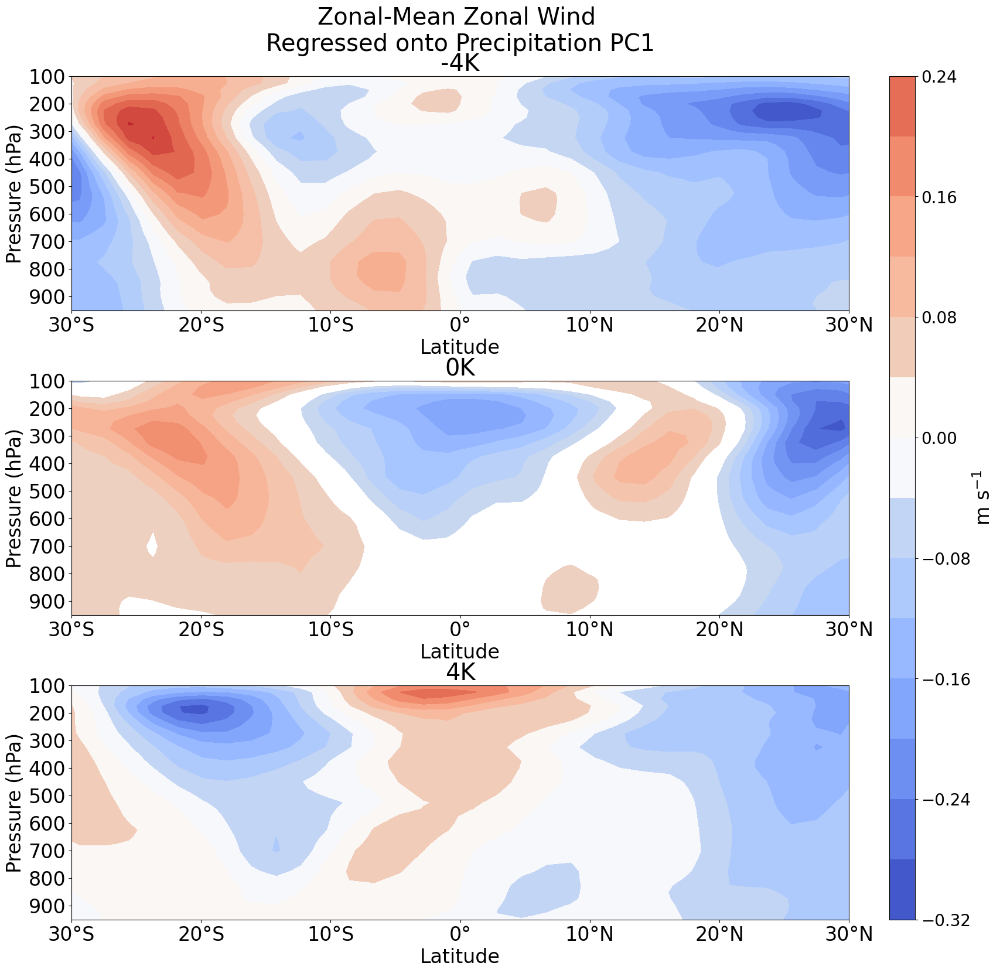

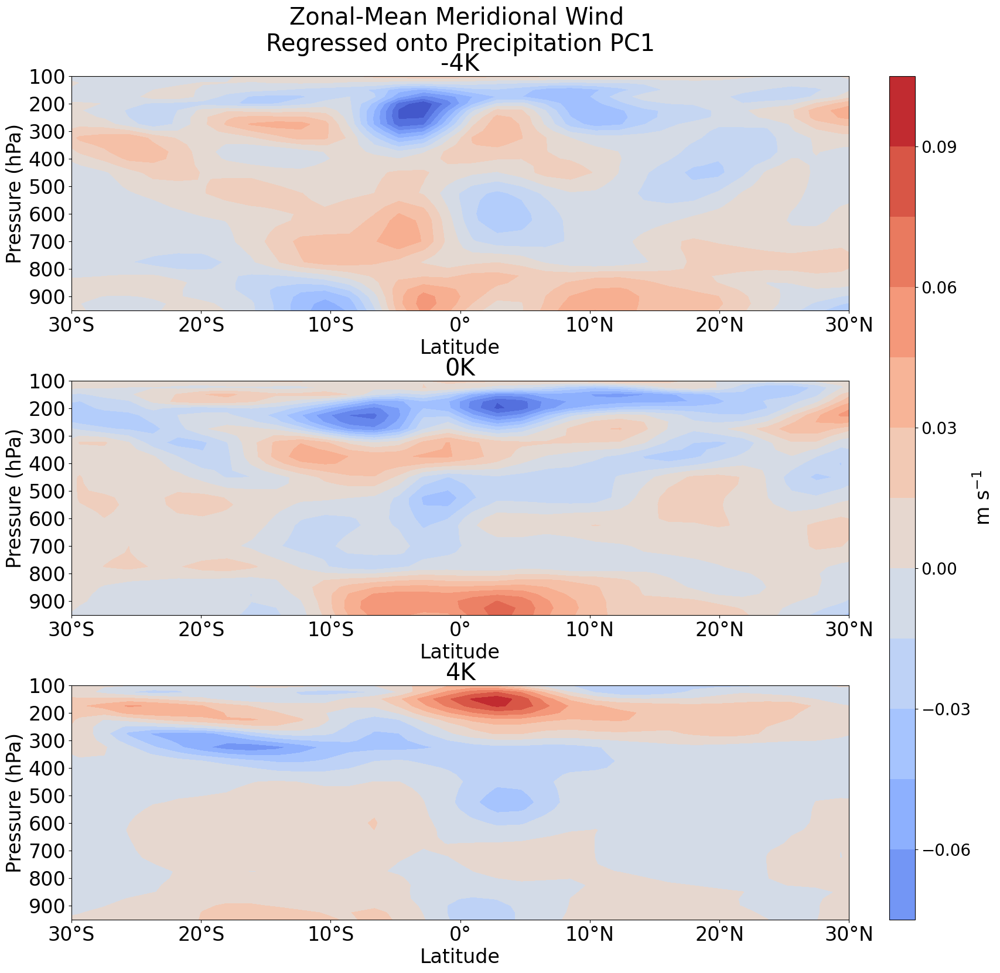

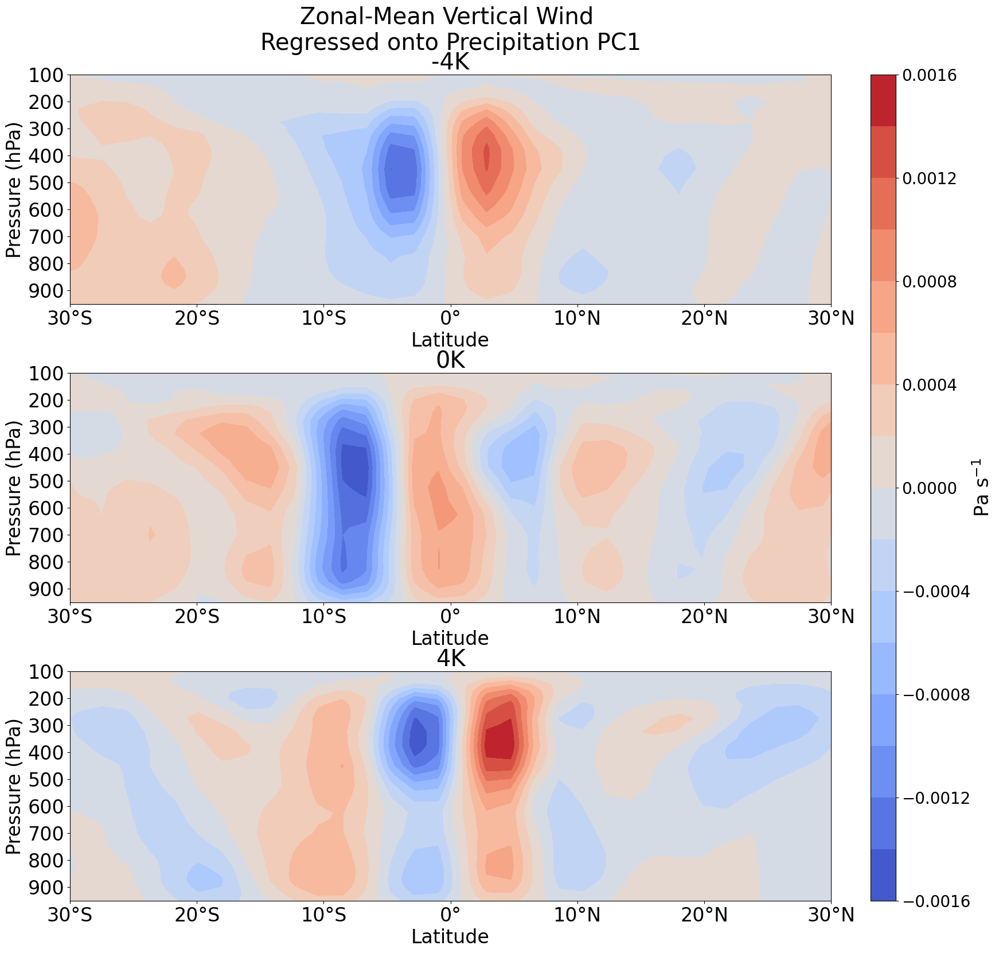

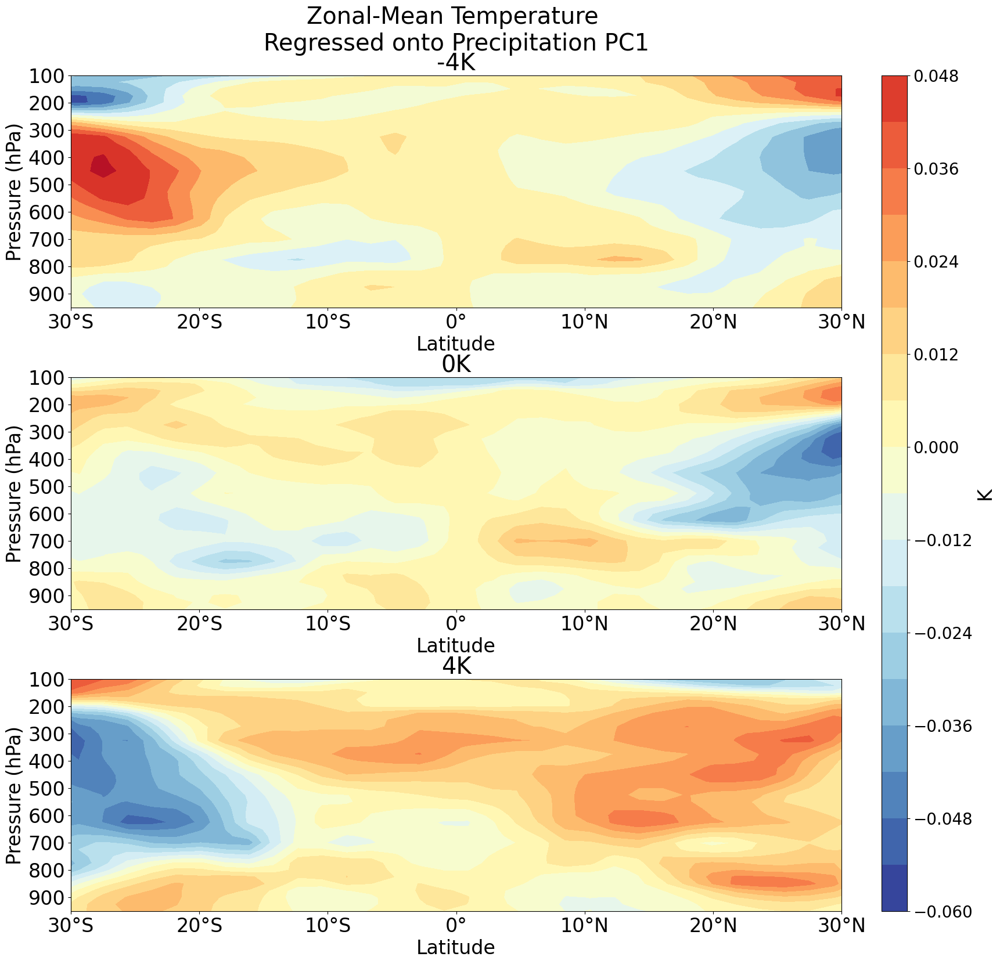

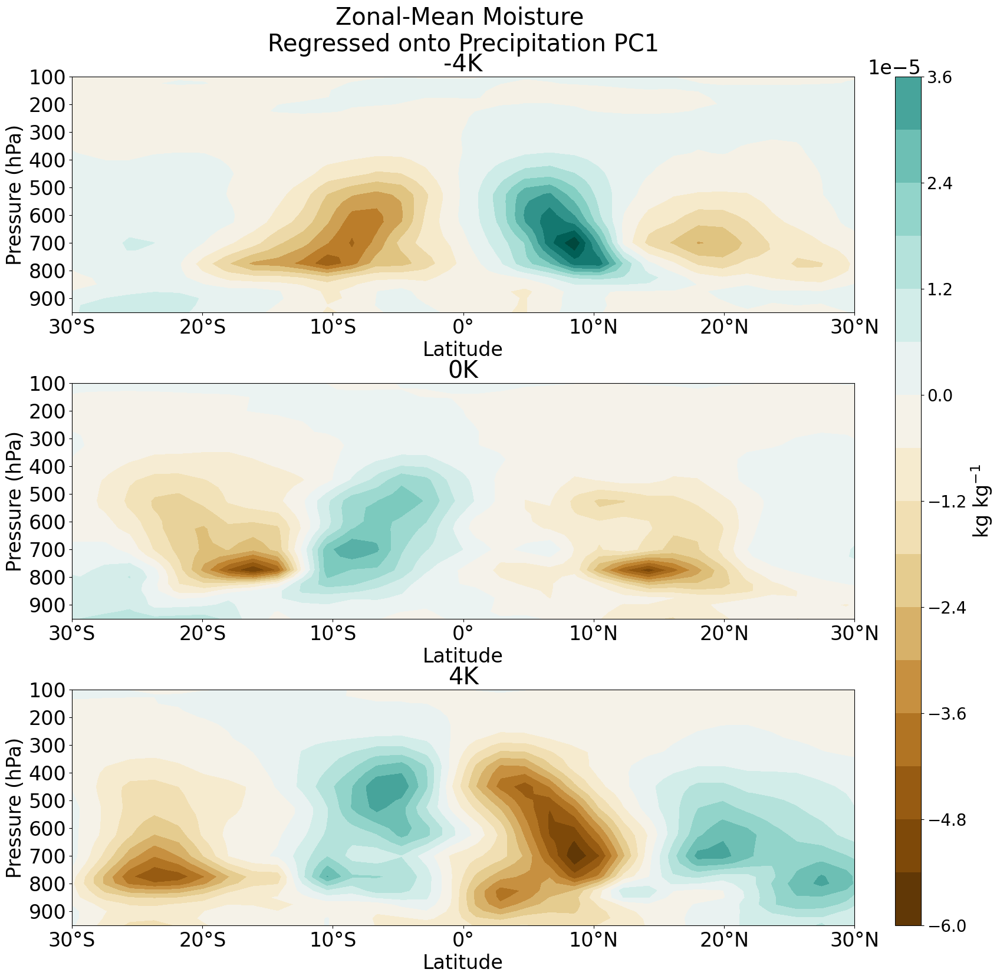

...

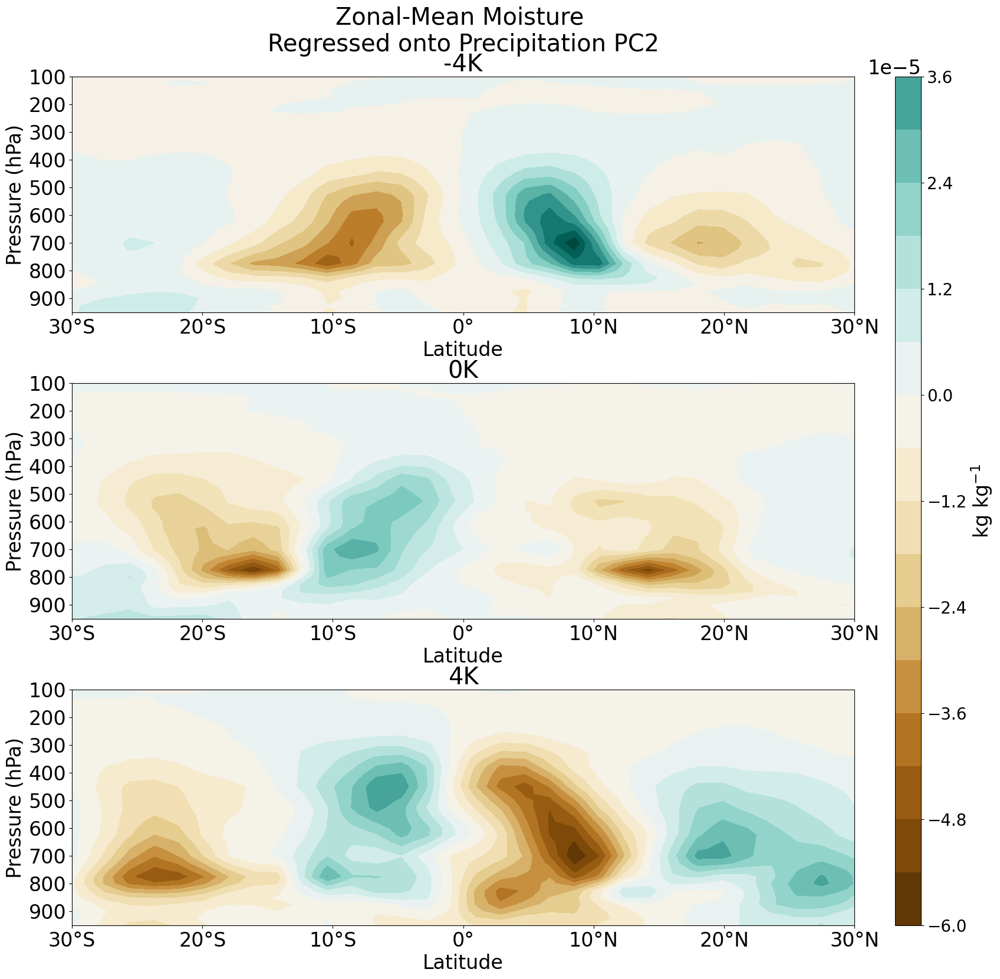

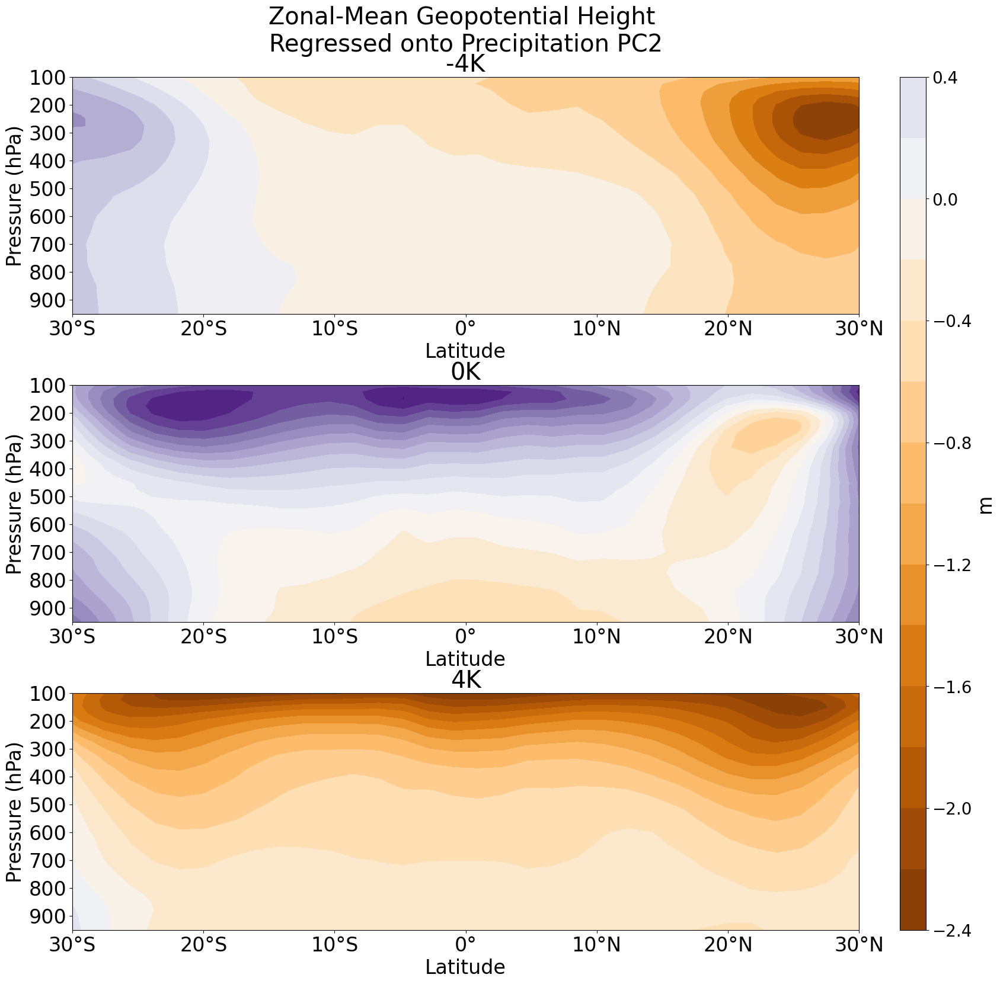

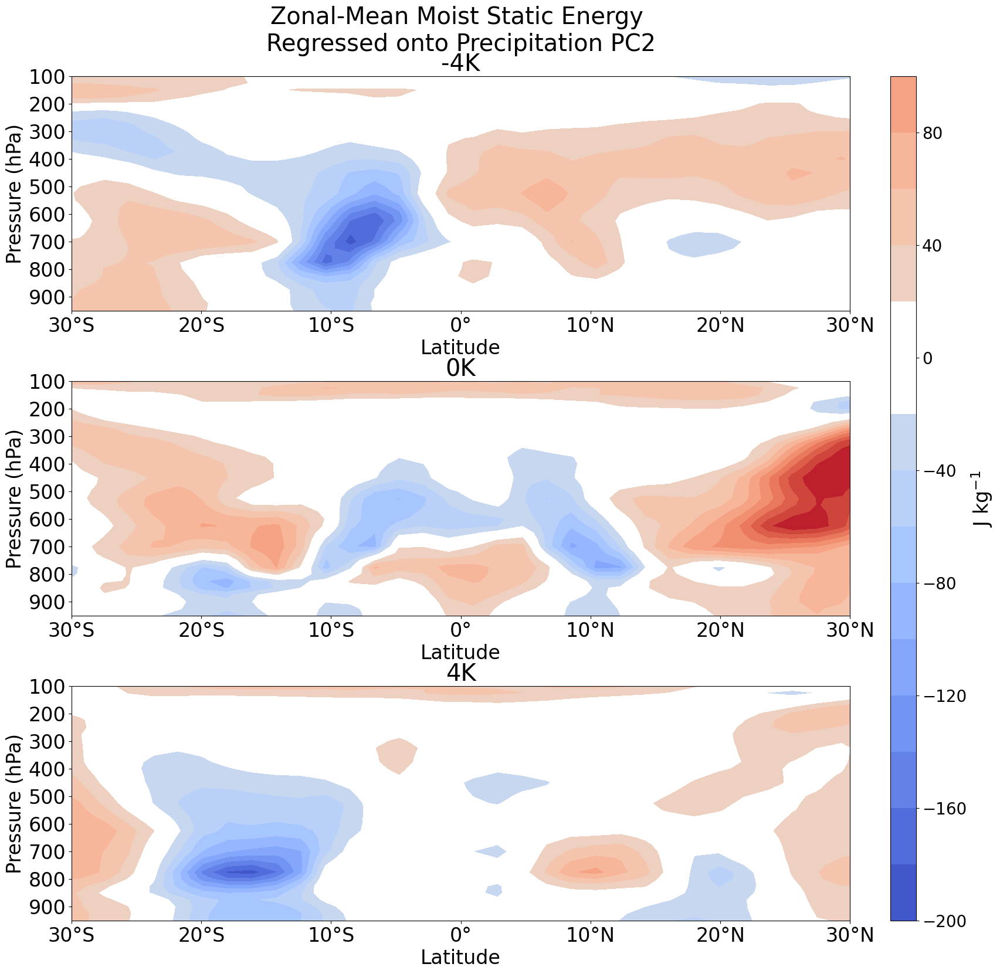

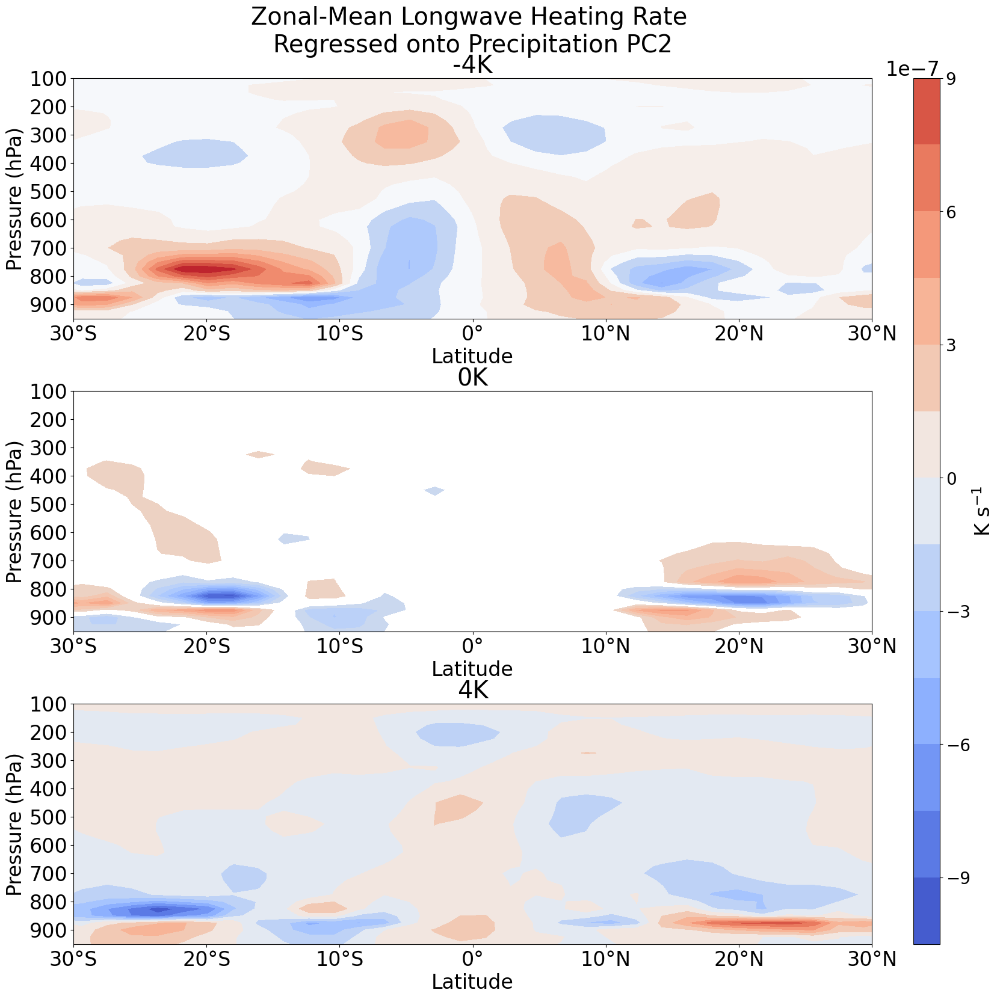

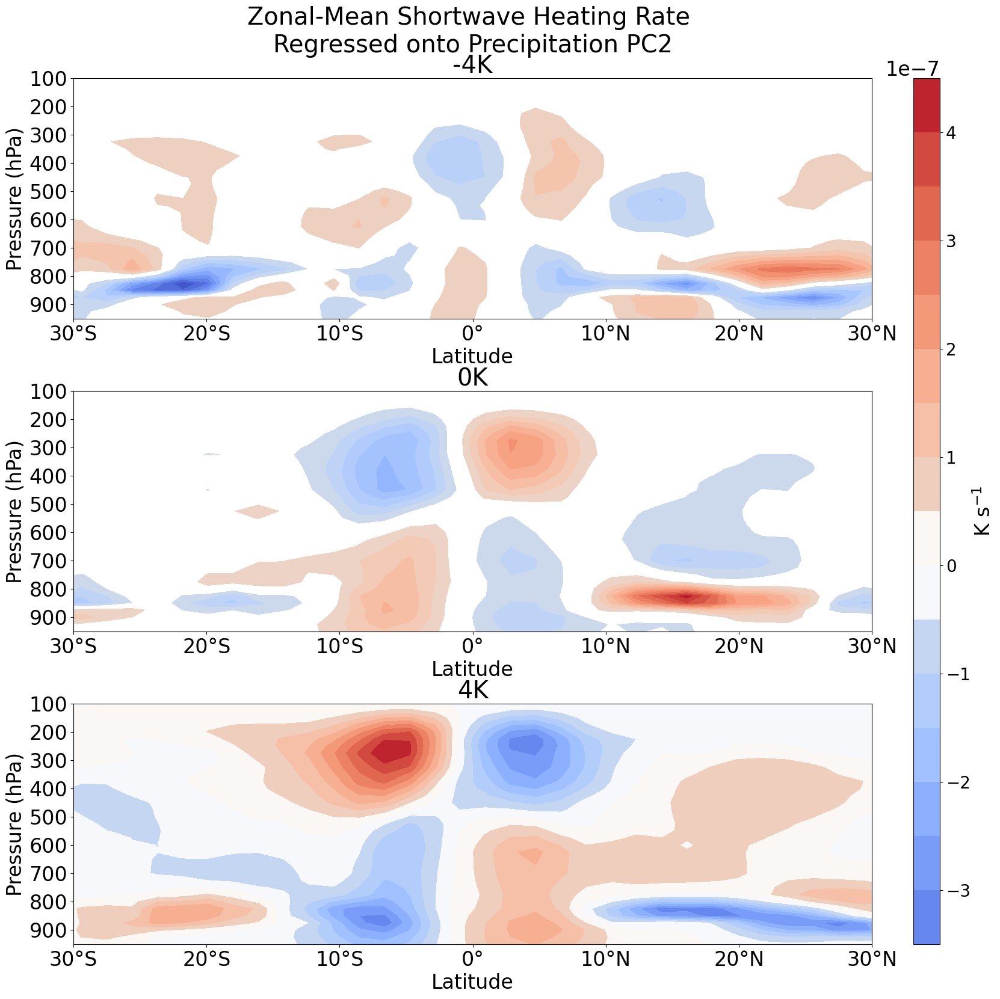

In [45]:
savefig=True
xr.set_options(keep_attrs=True)
meridional_mean_region = slice(-10,10)

for regression_PC in [1,2]:
    print(f'{f"Regressions onto PC {regression_PC}":^{str_width}}')
    print(f"{'='*str_width}")

    variables_to_plot = [
        multi_experiment_variables_regressed[regression_PC]['zonal wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['meridional wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['vertical wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['temperature'.title()],
        multi_experiment_variables_regressed[regression_PC]['moisture'.title()],
        multi_experiment_variables_regressed[regression_PC]['geopotential height'.title()],
        multi_experiment_variables_regressed[regression_PC]['moist static energy'.title()],
        multi_experiment_variables_regressed[regression_PC]['longwave heating rate'.title()],
        multi_experiment_variables_regressed[regression_PC]['shortwave heating rate'.title()],
    ]

    for variable_data in variables_to_plot:

        zonal_mean_variable_data = variable_data.mean(dim='lon')

        grand_max = zonal_mean_variable_data.max()
        grand_min = zonal_mean_variable_data.min()

        plt.style.use("default")
        plt.rcParams.update({"font.size": 24})

        fig = plt.figure(figsize=(16, 16))
        gs = GridSpec(3, 2, width_ratios=[30, 1], height_ratios=[1, 1, 1], figure=fig)
        gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.1)

        axes = []
        axes.append(fig.add_subplot(gs[0,0]))
        axes.append(fig.add_subplot(gs[1,0]))
        axes.append(fig.add_subplot(gs[2,0]))
        cb_ax = fig.add_subplot(gs[:, 1])

        for ax, experiment in zip(axes, experiments_list):

            ax.set_title(f"{experiment}")

            # Plot data
            im = ax.contourf(
                zonal_mean_variable_data.lat,
                zonal_mean_variable_data.plev,
                zonal_mean_variable_data.sel(experiment=experiment).T,
                levels=16,
                norm=mcolors.CenteredNorm(vcenter=0),
                **{k: copy.deepcopy(v) for k, v in {
                    # "norm": plotting_attributes[zonal_mean_variable_data.name].get("norm"),
                    "cmap": plotting_attributes[zonal_mean_variable_data.name].get("d_cmap")
                }.items() if v is not None}
            )

            # Add colorbar
            cbar = fig.colorbar(
                im,
                cax=cb_ax,
                label=zonal_mean_variable_data.attrs['units'],
                orientation="vertical",
            )
            cbar.ax.tick_params(labelsize=20)

            # Axis parameters
            ax.set_xlim(-30, 30)
            x_ticks = np.arange(-30, 30+10, 10)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(tick_labeller(x_ticks, "lat"))
            # ax.xaxis.set_major_locator(mticker.MaxNLocator(5, prune="lower"))
            ax.set_xlabel("Latitude")

            ax.set_ylim(100, 950)
            ax.set_yticks(np.arange(100, 1000, 100))
            ax.set_ylabel("Pressure (hPa)")
            ax.invert_yaxis()

            ax.set_aspect('auto')

        fig.suptitle(
            (
                f"Zonal-Mean"
                + f" {variable_data.name.title()} \nRegressed onto {compositing_variable.name} PC{regression_PC}"
            ),
            x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
            ha='center',
            y=1.025
        )

        if not savefig:
            plt.show()
        else:
            save_string = (
                f"multi-experiment_zonal-mean"
              + f"_{zonal_mean_variable_data.attrs['file_id']}"
              + f"_regressed-on-{compositing_variable.attrs['file_id']}-PC{regression_PC}"
              + f".png"
                )
            print(f"Saving {variable_data.name} plot as {save_string}")
            plt.savefig(
                f"{output_directory}/regressions/latitude-height/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")

## Lag Regressions

### Lag regress variables

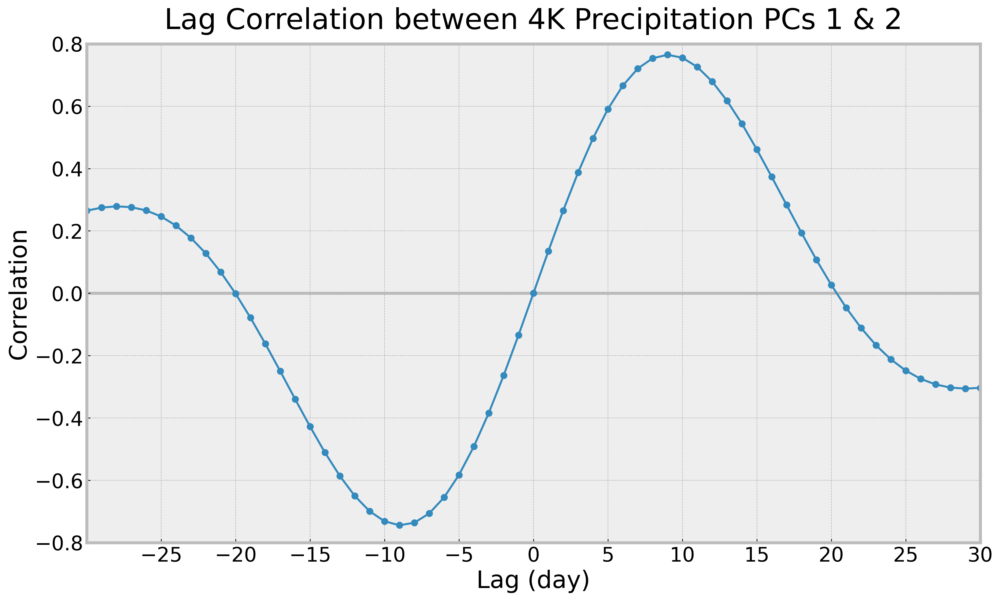

Finished


In [133]:
# output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
# savefig = False

# PCs_to_use = [1, 2]

# correlation = []
# lag_days = np.arange(-30, 31)
# for lag in lag_days:
#     correlation.append(
#         np.correlate(
#             standardize_data(PC[PCs_to_use[0]-1]),
#             np.roll(standardize_data(PC[PCs_to_use[1]-1]), shift=lag),
#         )
#         / len(PC[0])
#     )

# plt.style.use("bmh")
# plt.rcParams.update({"font.size": 20})

# [fig, ax] = plt.subplots(figsize=(16, 9))
# ax.set_title(
#     f"Lag Correlation between {experiment} {compositing_variable.name} PCs {PCs_to_use[0]} & {PCs_to_use[1]}",
#     pad=15
# )

# ax.plot(lag_days, correlation, marker="o")
# ax.axhline(y=0, color="#bcbcbc", lw=3, zorder=-10)
# ax.set_ylim(-0.8, 0.8)
# ax.set_xlim(-30, 30)
# ax.set_yticks(np.arange(-0.8, 1, 0.2))
# ax.set_xticks(np.arange(-30, 35, 5))
# ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=13, prune="lower"))
# ax.set_xlabel("Lag (day)")
# ax.set_ylabel("Correlation")
# for spine in ax.spines.values():
#     spine.set_edgecolor("#bcbcbc")
#     spine.set_linewidth(3)

# if not savefig:
#     plt.show()
# else:
#     save_string = (
#         f"{experiment}"
#       + f"_{compositing_variable.attrs['file_id']}"
#       + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
#       + f"_PC-{PCs_to_use[0]}-{PCs_to_use[1]}_lag-correlation.png"
#         )
#     print(f"Saving plot as {save_string}")
#     plt.savefig(
#         f"{output_directory}/correlations/PC-lag-correlations/{save_string}",
#         dpi=500,
#         bbox_inches="tight",
#     )

# print(f"{'='*40}")
# print("Finished")

In [347]:
print(f"{'Lag Regressions':^{str_width}}")
print(f"{f'Regression Variable: {regression_variable}':^{str_width}}")
print(f"{'='*str_width}")

meridional_mean_region = slice(-10,10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"
lag_days = np.arange(-30, 31)
multi_experiment_lag_regression = {}
lag_regression_variable = 'Precipitation'

# Identify reference timeseries
reference_longitude = 180
reference_latitude = (
    multi_experiment_variables_mjo_filtered[lag_regression_variable]
).var(dim='time').mean(dim='lon').idxmax(dim='lat')

# Select the timeseries at the correct reference location for each experiment
selected_timeseries = []
for exp, lat in zip(multi_experiment_variables_mjo_filtered[lag_regression_variable].experiment, reference_latitude):

    experiment_reference_timeseries = multi_experiment_variables_mjo_filtered[lag_regression_variable].sel(
        experiment=exp, lat=lat, lon=reference_longitude
    )
    selected_timeseries.append(experiment_reference_timeseries)

# Combine all timeseries into a single DataArray if needed
reference_timeseries = xr.concat(selected_timeseries, dim="experiment")
reference_timeseries = reference_timeseries.drop_sel(time=missing_days, errors='ignore')

for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
    print(f'{f"({index+1}/{len(multi_experiment_variables_subset)}) {variable_name}...":<{str_width-1}}', end="")

    if not variable_name in variables_to_load:
        print(f"{variable_name} not in variables to load, skipping...")
        continue

    if 'plev' in variable_data.coords:
        multi_experiment_lag_regression[variable_name] = xr.DataArray(
            data=np.empty(
                (
                    len(experiments_list),
                    len(lag_days),
                    len(variable_data.lat),
                    len(variable_data.lon),
                    len(variable_data.plev)
                )
            ),
            dims=["experiment", "lag", "lat", "lon", "plev"],
            coords=dict(
                experiment=experiments_list,
                lag=lag_days,
                lat=variable_data.lat,
                lon=variable_data.lon,
                plev=variable_data.plev
            ),
            attrs = variable_data.attrs
        )
    else:
        multi_experiment_lag_regression[variable_name] = xr.DataArray(
            data=np.empty((len(experiments_list), len(lag_days), len(variable_data.lat), len(variable_data.lon))),
            dims=["experiment", "lag", "lat", "lon"],
            coords=dict(
                experiment=experiments_list,
                lag=lag_days,
                lat=variable_data.lat,
                lon=variable_data.lon
            ),
            attrs = variable_data.attrs
        )

    for lag_index, lag in enumerate(lag_days):
        multi_experiment_lag_regression[variable_name][:, lag_index] = np.einsum(
                'ij...,ij...->i...',
                standardize_data(variable_data, dim='time', unit_variance=False),
                np.roll(standardize_data(reference_timeseries), shift=lag),
            ) / len(reference_timeseries.time)
    print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

            Lag Regressions             
Regression Variable: MJO-filtered Precipitation
(1/4) Precipitation...                 ✔
(2/4) Zonal Wind...                    Zonal Wind not in variables to load, skipping...
(3/4) Vertical Wind...                 Vertical Wind not in variables to load, skipping...
(4/4) Outgoing Longwave Radiation...   Outgoing Longwave Radiation not in variables to load, skipping...
Finished


### Plot lag-regressed variables

#### Lag-longitude

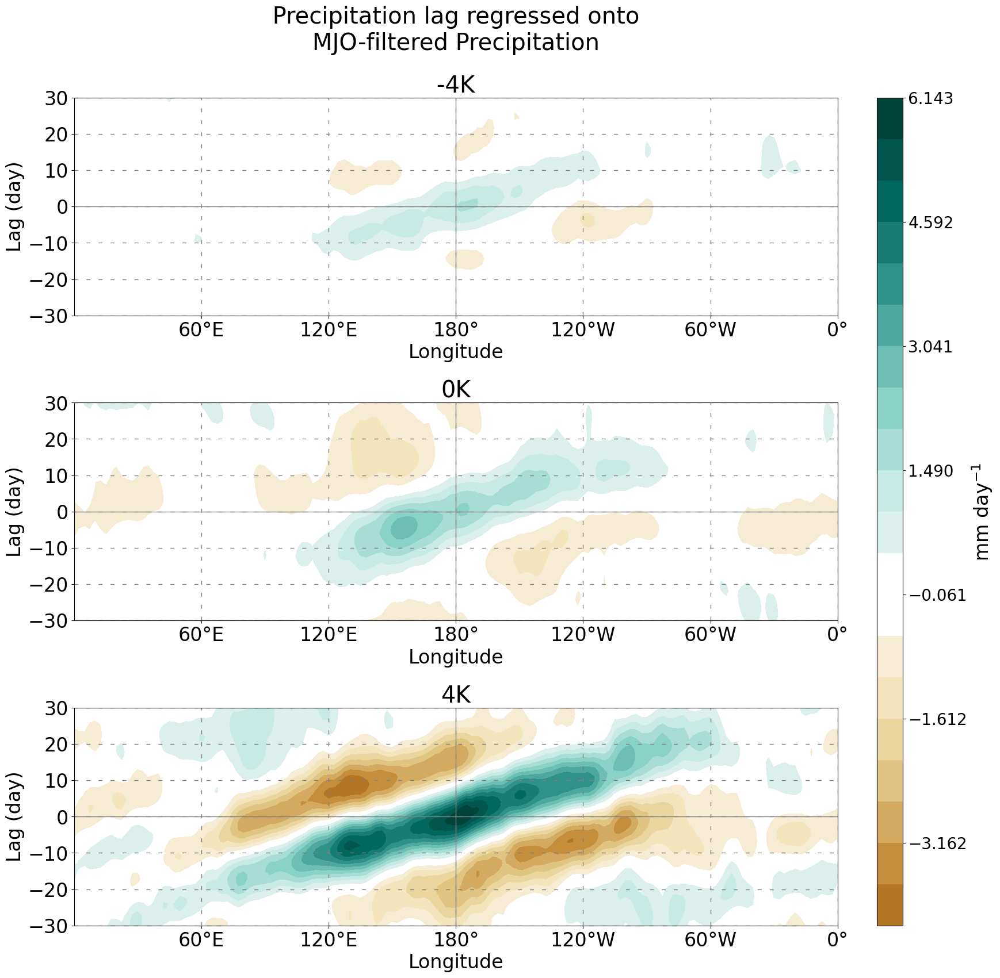

Finished


In [361]:
output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
savefig=False

plt.style.use("default")
plt.rcParams.update({"font.size": 24})
multi_experiment_lag_regression['Precipitation'].name = 'Precipitation'
multi_experiment_lag_regression['Precipitation'] *= (15/multi_experiment_lag_regression['Precipitation'].sel()
variables_to_plot = [
    multi_experiment_lag_regression['precipitation'.title()],
    # scaled_multi_experiment_lag_regression['outgoing longwave radiation'.title()],
    # scaled_multi_experiment_lag_regression['zonal wind'.title()].sel(plev=200),
    # scaled_multi_experiment_lag_regression['zonal wind'.title()].sel(plev=850),
    # multi_experiment_lag_regression['vertical wind'.title()].sel(plev=500),
    # multi_experiment_variables_regressed['column temperature'.title()],
    # multi_experiment_variables_regressed['column water vapor'.title()],
    # multi_experiment_lag_regression['moist static energy'.title()].sel(plev=850),
    # multi_experiment_variables_regressed['column longwave heating'.title()],
    # multi_experiment_variables_regressed['column shortwave heating'.title()],
    # multi_experiment_lag_regression['latent heat flux'.title()],
    # multi_experiment_lag_regression['sensible heat flux'.title()],
]

print(f"{'='*str_width}")
for variable_data in variables_to_plot:
    grand_max = variable_data.max()
    grand_min = variable_data.min()

    fig = plt.figure(figsize=(16, 16))
    gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
    gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.4, wspace=0.1)

    axes = []
    axes.append(fig.add_subplot(gs[0,0]))
    axes.append(fig.add_subplot(gs[1,0]))
    axes.append(fig.add_subplot(gs[2,0]))
    cb_ax = fig.add_subplot(gs[:, 1])

    for ax, experiment in zip(axes, experiments_list):
        ax.set_title(f"{experiment}")

        # Add cyclic point
        cdata, clon = cutil.add_cyclic_point(
            # variable_data.sel(experiment=experiment, lat=slice(-10,10)).weighted(weights).mean(dim='lat'),
            variable_data.sel(experiment=experiment, lat=reference_latitude.sel(experiment=experiment)),
            coord=variable_data.lon,
        )

        # Plot data
        im = ax.contourf(
            clon,
            variable_data.lag,
            cdata,
            levels=np.linspace(grand_min, grand_max, 21),
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                # "norm": plotting_attributes[variable_data.name].get('norm'),
                "cmap": plotting_attributes[variable_data.name].get('d_cmap')
            }.items() if v is not None}
        )

        # Add colorbar
        cbar = fig.colorbar(
            im,
            cax=cb_ax,
            label=variable_data.attrs['units'],
            orientation="vertical",
        )
        cbar.ax.tick_params(labelsize=20)

        # ax.plot(reference_longitude, reference_latitude.sel(experiment=experiment), marker='x', color='k', ms=14)
        ax.axhline(y=0, ls='-', color="grey", lw=1)
        ax.axvline(x=180, ls='-', color="grey", lw=1)

        # Axis parameters
        ax.set_aspect("auto")

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 60, 60)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
        ax.set_xlabel("Longitude")

        ax.set_ylim(-30, 30)
        y_ticks = np.arange(-30, 40, 10)
        ax.set_yticks(y_ticks)
        ax.set_ylabel("Lag (day)")

        # grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "grey"}
        ax.grid(True, **grid_kwargs)

    fig.suptitle(
        (
            f"{(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')}"
            + f" {variable_data.name} lag regressed onto \n{regression_variable}{(regression_index+1 if regression_variable == 'PCs' else '')}"
        ),
        x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
        ha='center',
        y=1.05
    )

    if not savefig:
        plt.show()
    else:
        save_string = (
            f"multi-experiment_{variable_data.attrs['file_id']}"
          + f"{((str(variable_data.plev.values)) if 'plev' in variable_data.coords else '')}"
          + f"lag_regressed-on-{regression_variable.replace(' ', '-')}{(regression_index+1 if regression_variable == 'PCs' else '')}"
          + f".png"
            )
        print(
            f"Saving {(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')} {variable_data.name} plot as {save_string}"
        )
        plt.savefig(
            f"{output_directory}/regressions/latitude-longitude/{save_string}",
            dpi=500,
            bbox_inches="tight",
        )

print(f"{'='*40}")
print("Finished")

#### Lag-Latitude

Variable: Precipitation
Computing correlations...
Correlations computed


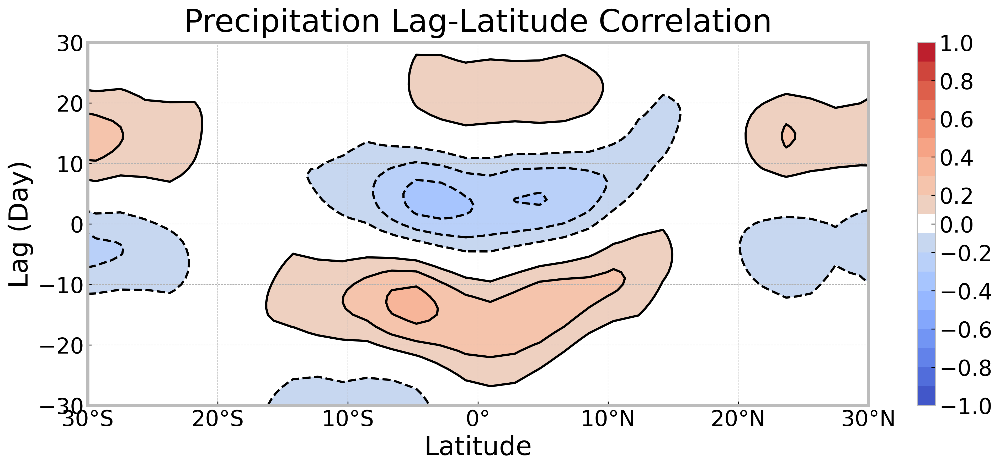

Variable: Outgoing Longwave Radiation
Computing correlations...
Correlations computed


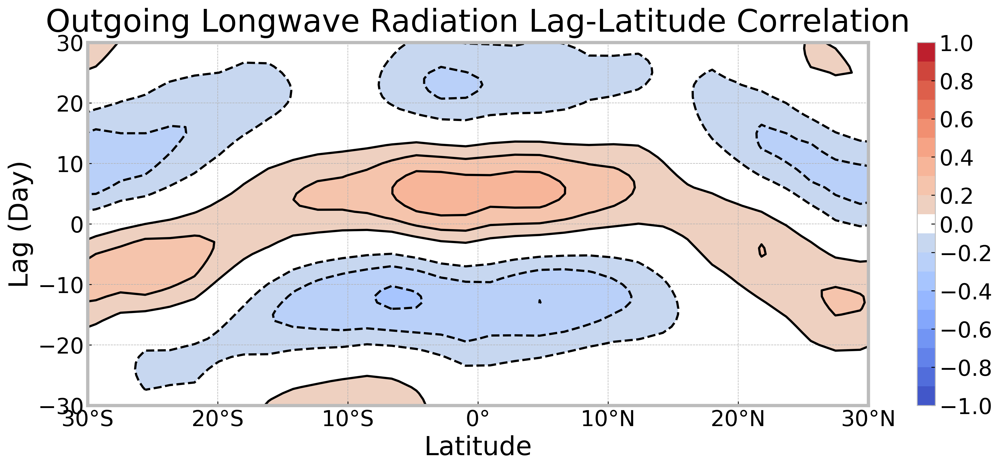

Variable: Zonal Wind
Computing correlations...
Correlations computed


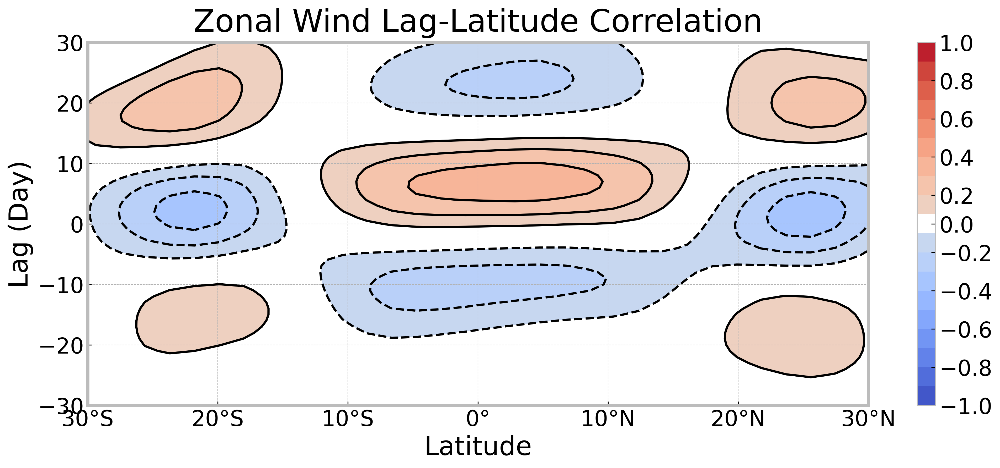

Variable: Zonal Wind
Computing correlations...
Correlations computed


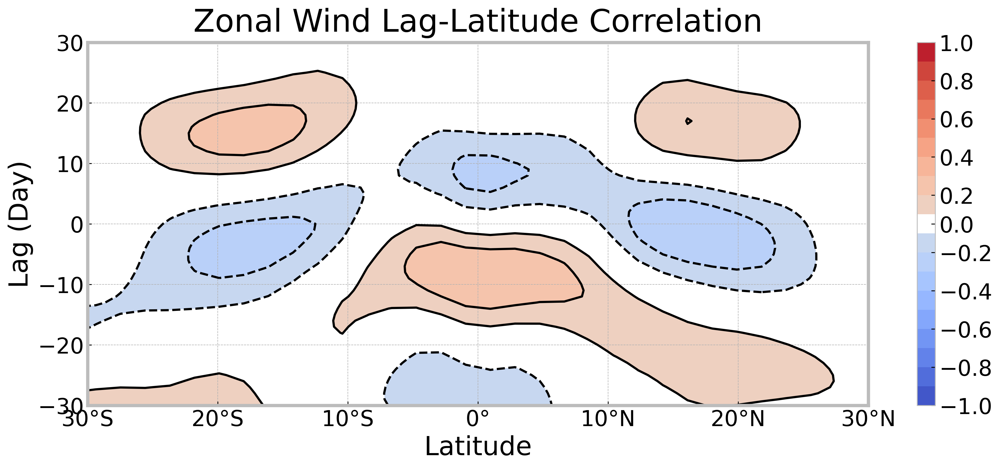

Variable: Vertical Wind
Computing correlations...
Correlations computed


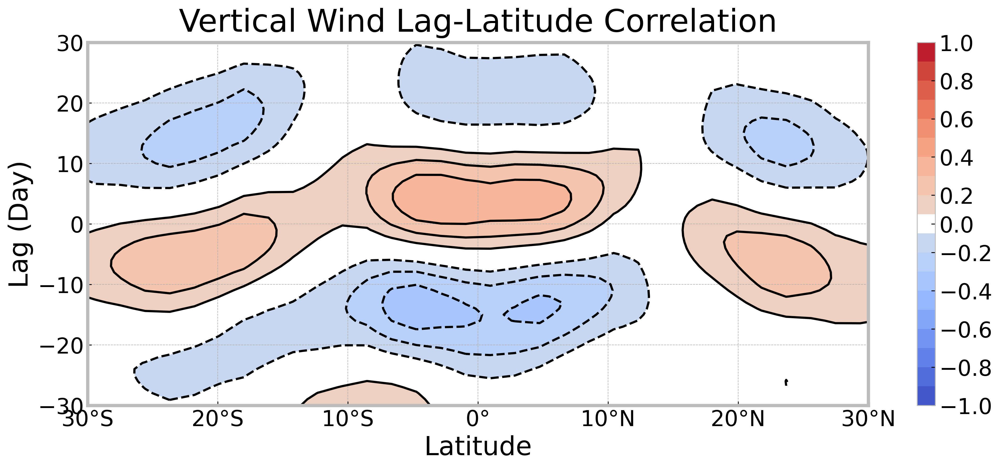

Variable: Column Temperature
Computing correlations...
Correlations computed


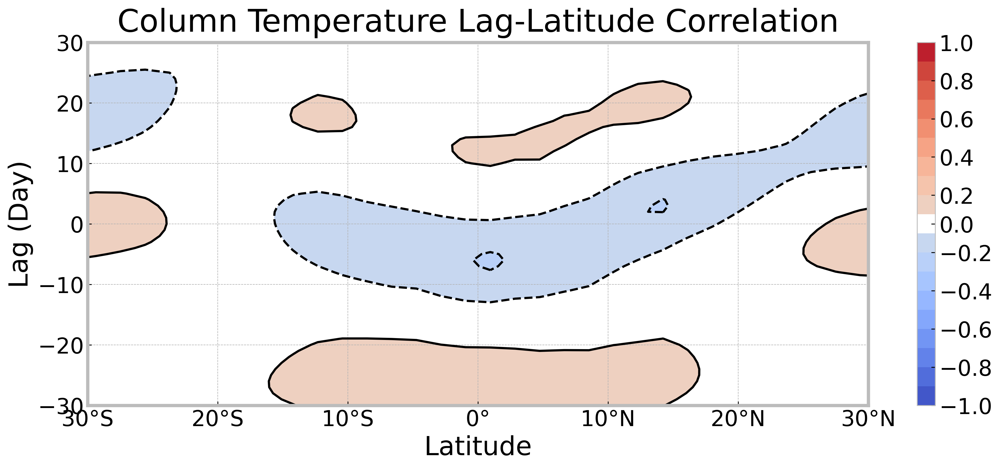

Variable: Column Water Vapor
Computing correlations...
Correlations computed


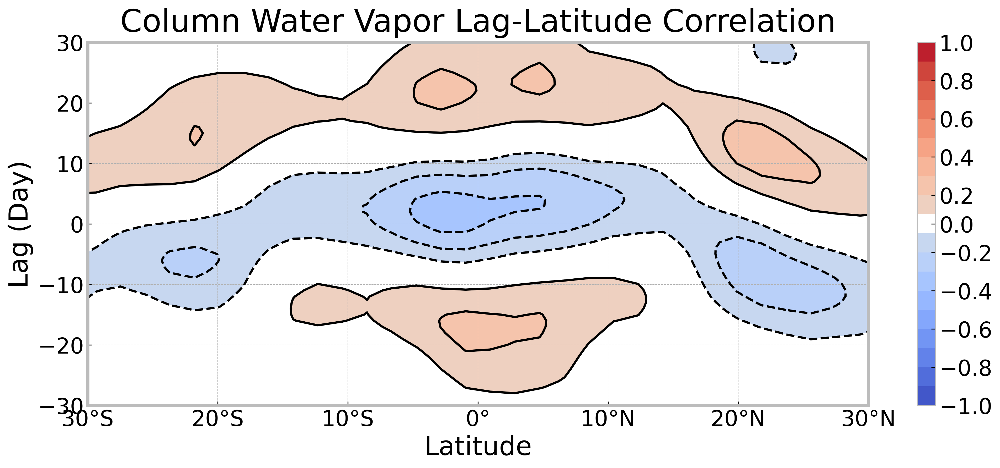

Finished


In [188]:
calculate_corr = True
plot_corr = True
savefig = False

lag_days = np.arange(-30, 31)
reference_lon = 180
meridional_mean_region = slice(-10, 10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"

variables_to_plot = [
    variables_filtered['precipitation'.title()],
    variables_filtered['outgoing longwave radiation'.title()],
    variables_filtered['zonal wind'.title()].sel(plev=200),
    variables_filtered['zonal wind'.title()].sel(plev=850),
    variables_filtered['vertical wind'.title()].sel(plev=500),
    variables_filtered['column temperature'.title()],
    variables_filtered['column water vapor'.title()],
]

if calculate_corr or 'lag_latitude_correlation' not in globals():
    lag_latitude_correlation = {}

for variable in variables_to_plot:
    print(f"Variable: {variable.name}")

    if calculate_corr:
        # lag_latitude_correlation[variable.name] = np.empty((len(lag_days), len(longitude)))
        lag_latitude_correlation[variable.name] = xr.DataArray(
            data=np.empty((len(lag_days), len(latitude))),
            dims=["lag", "lat"],
            coords=dict(
                lag=lag_days,
                lat=latitude
            )
        )

        # reference_time_series = variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat')
        reference_time_series = PC[0]

        print("Computing correlations...")
        for lag_index, lag in enumerate(lag_days):
            lag_latitude_correlation[variable.name][lag_index] = np.einsum(
                    'ij,i->j',
                    standardize_data(variable.sel(lon=reference_lon)),
                    np.roll(standardize_data(reference_time_series), shift=lag),
                ) / len(reference_time_series)
        print("Correlations computed")

    if plot_corr:
        plt.style.use("bmh")
        plt.rcParams.update({"font.size": 20})
        [fig, ax] = plt.subplots(figsize=(16, 6))

        ax.set_title(
            f"{variable.name} Lag-Latitude Correlation",
            pad=10
        )

        levels = np.linspace(-1, 1, 21)

        im = ax.contourf(
            lag_latitude_correlation[variable.name].lat,
            lag_latitude_correlation[variable.name].lag,
            lag_latitude_correlation[variable.name],
            cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
            levels=levels[levels != 0]
        )
        cbar = fig.colorbar(im)
        cbar.set_ticks(np.arange(-1, 1.2, 0.2))

        ax.contour(
            lag_latitude_correlation[variable.name].lat,
            lag_latitude_correlation[variable.name].lag,
            lag_latitude_correlation[variable.name],
            colors="k",
            levels=levels[levels != 0]
        )


        ax.set_xlim(-30, 30)
        ax.set_ylim(-30, 30)
        xtick_locations = np.arange(-30, 30 + 10, 10)
        ax.set_xticks(ticks=xtick_locations, labels=tick_labeller(xtick_locations, "lat"))
        # ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_xlabel("Latitude")
        ax.set_ylabel("Lag (Day)")

        for spine in ax.spines.values():
            spine.set_edgecolor("#bcbcbc")
            spine.set_linewidth(3)

        # plt.show()
        if not savefig:
            plt.show()
        else:
            save_string = (
                f"{experiment}"
                + f"_{compositing_variable.attrs['file_id']}"
                + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
                + f"_PC-{PCs_to_use[0]+1}-{PCs_to_use[1]+1}_lag-longitude-correlation.png"
            )
            print(f"Saving plot as {save_string}")
            plt.savefig(
                f"{output_directory}/correlations/lag-latitude/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")

#### Lag-Height

Variable: Zonal Wind
Computing correlations...
Correlations computed


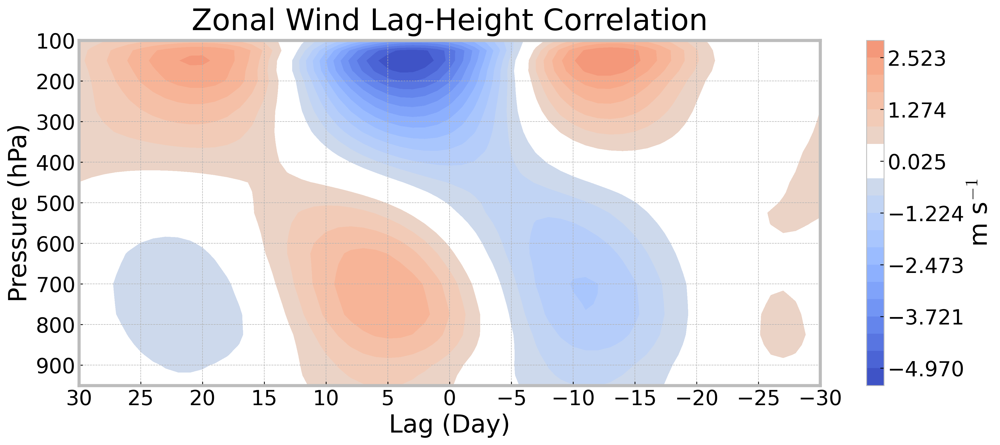

Variable: Meridional Wind
Computing correlations...
Correlations computed


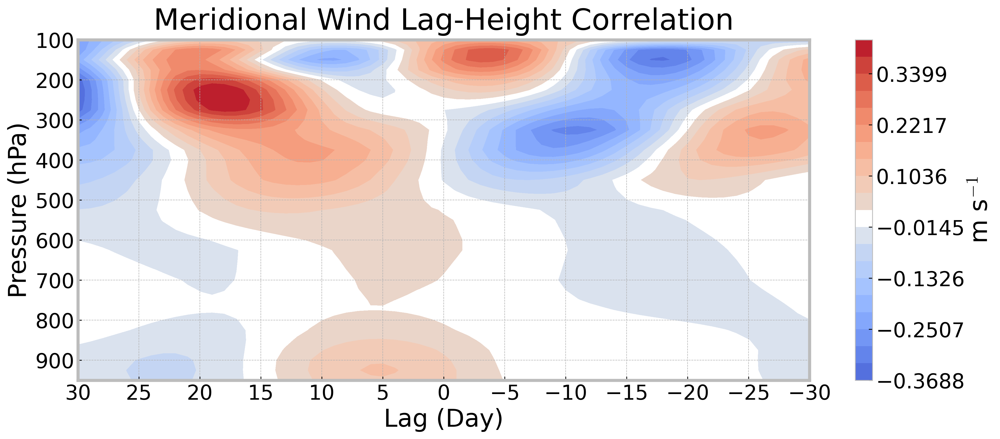

Variable: Vertical Wind
Computing correlations...
Correlations computed


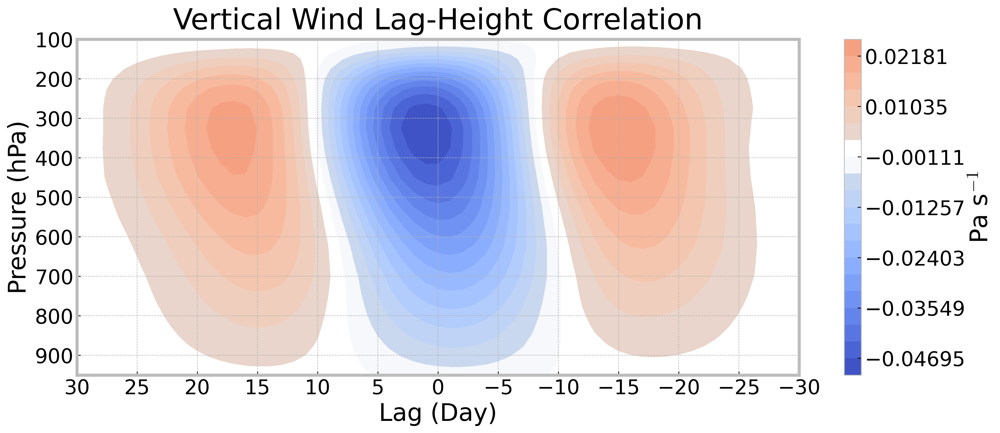

Variable: Temperature
Computing correlations...
Correlations computed


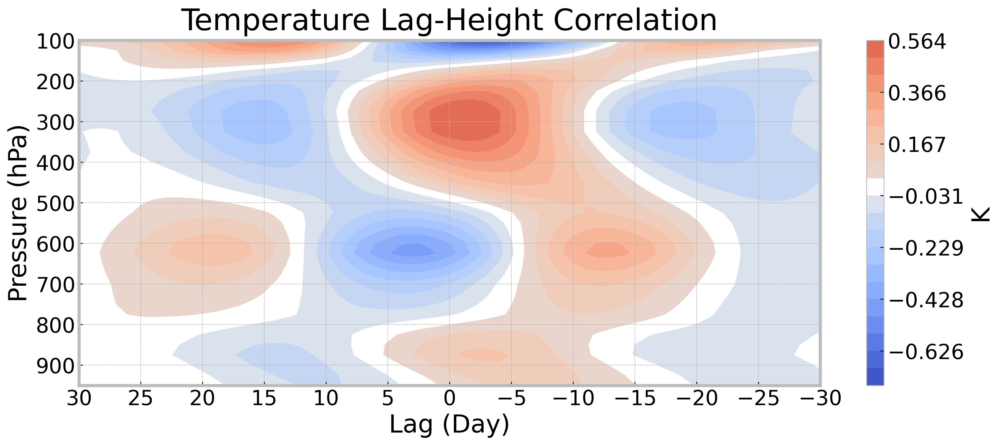

Variable: Moisture
Computing correlations...
Correlations computed


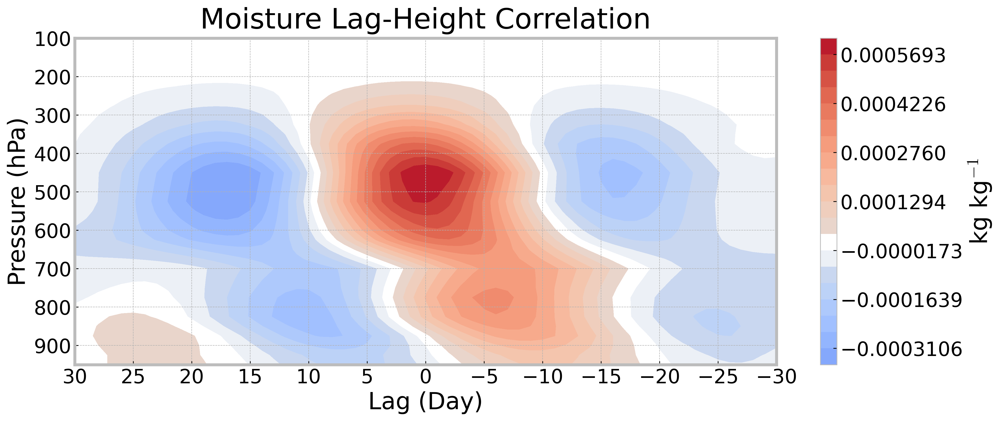

Variable: Geopotential Height
Computing correlations...
Correlations computed


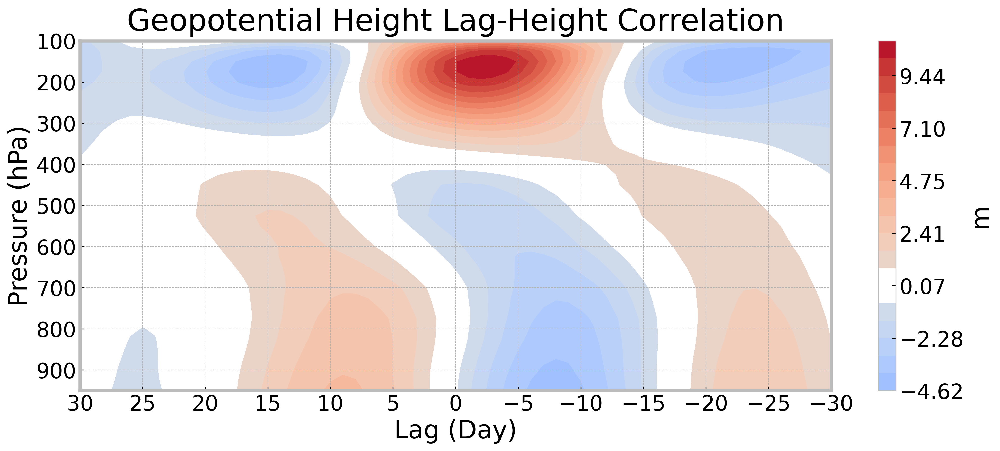

Variable: Moist Static Energy
Computing correlations...
Correlations computed


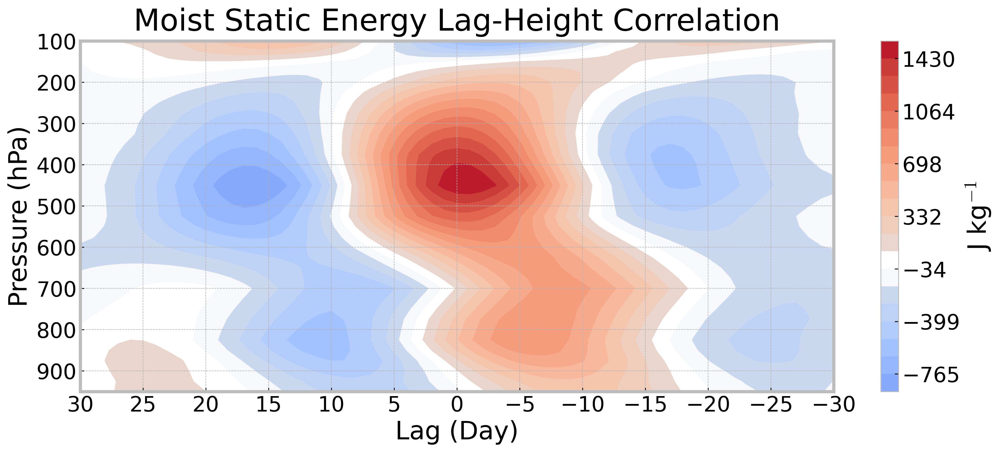

Variable: Longwave Heating Rate
Computing correlations...
Correlations computed


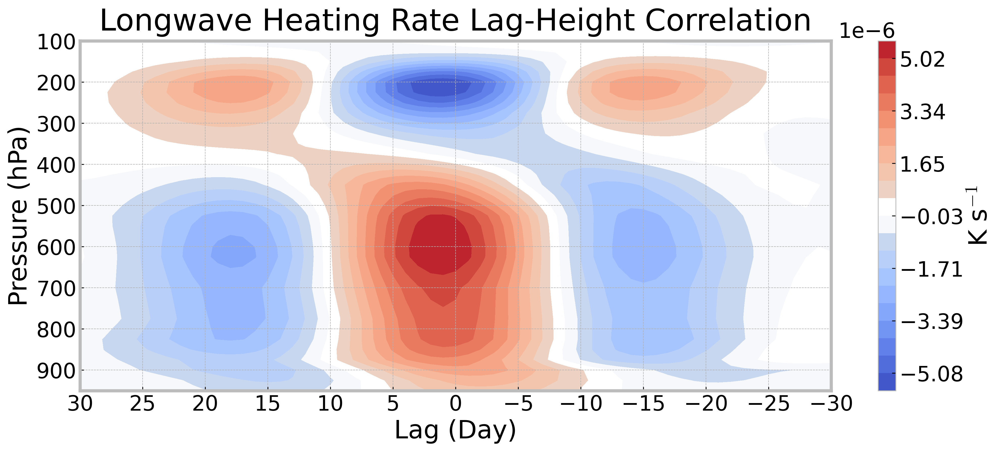

Variable: Shortwave Heating Rate
Computing correlations...
Correlations computed


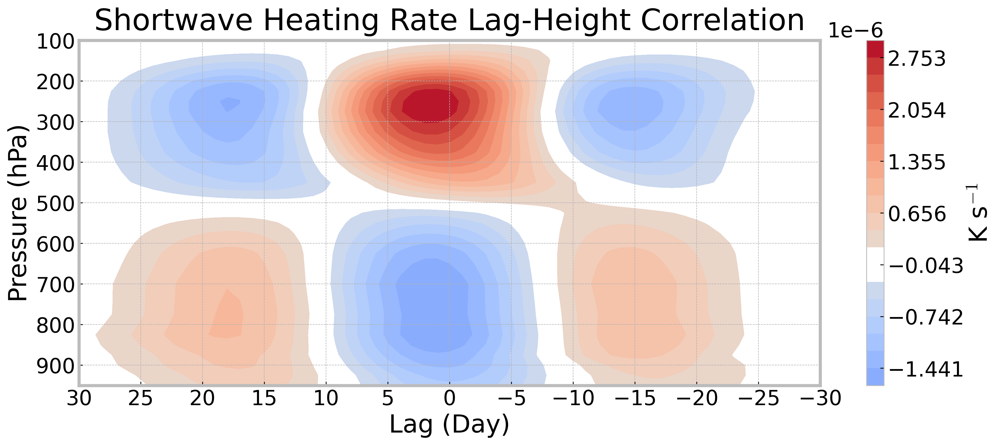

Finished


In [199]:
calculate_corr = True
plot_corr = True
savefig = False

lag_days = np.arange(-30, 31)
reference_lon = 180
meridional_mean_region = slice(-10, 10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"

variables_to_plot = [
    variables_filtered['zonal wind'.title()],
    variables_filtered['meridional wind'.title()],
    variables_filtered['vertical wind'.title()],
    variables_filtered['temperature'.title()],
    variables_filtered['moisture'.title()],
    variables_filtered['geopotential height'.title()],
    variables_filtered['moist static energy'.title()],
    variables_filtered['longwave heating rate'.title()],
    variables_filtered['shortwave heating rate'.title()],
]

if calculate_corr or 'lag_height_correlation' not in globals():
    lag_height_correlation = {}

for variable in variables_to_plot:
    print(f"Variable: {variable.name}")

    if calculate_corr:
        lag_height_correlation[variable.name] = xr.DataArray(
            data=np.empty((len(lag_days), len(pressure_levels))),
            dims=["lag", "plev"],
            coords=dict(
                lag=lag_days,
                plev=pressure_levels
            )
        )

        # reference_time_series = variable.sel(lon=reference_lon, lat=meridional_mean_region, plev=500).weighted(weights).mean(dim='lat')
        reference_time_series = variables_filtered['Precipitation'].sel(
            lon=reference_lon, lat=meridional_mean_region
        ).weighted(weights).mean(dim='lat')
        # reference_time_series = PC[0]

        print("Computing correlations...")
        for lag_index, lag in enumerate(lag_days):
            lag_height_correlation[variable.name][lag_index] = np.einsum(
                    'ij,i->j',
                    # standardize_data(variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat')),
                    variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat'),
                    np.roll(standardize_data(reference_time_series), shift=lag),
                ) / len(reference_time_series)
        print("Correlations computed")

    if plot_corr:
        plt.style.use("bmh")
        plt.rcParams.update({"font.size": 20})
        [fig, ax] = plt.subplots(figsize=(16, 6))

        ax.set_title(
            f"{variable.name} Lag-Height Correlation",
            pad=10
        )

        # levels = np.linspace(-1, 1, 21)
        levels = np.linspace(
            lag_height_correlation[variable.name].min(),
            lag_height_correlation[variable.name].max(),
            21
        )

        im = ax.contourf(
            lag_height_correlation[variable.name].lag,
            lag_height_correlation[variable.name].plev,
            lag_height_correlation[variable.name].T,
            cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
            norm=mcolors.CenteredNorm(vcenter=0),
            levels=levels[levels != 0]
        )
        cbar = fig.colorbar(im)
        cbar.set_label(f"{variable.attrs['units']}")
        # cbar.set_ticks(np.arange(-1, 1.2, 0.2))

        # ax.contour(
        #     lag_height_correlation[variable.name].lag,
        #     lag_height_correlation[variable.name].plev,
        #     lag_height_correlation[variable.name].T,
        #     colors="k",
        #     levels=levels[levels != 0]
        # )

        ax.set_xlim(-30, 30)
        ax.set_xticks(np.arange(-30, 35, 5))
        ax.invert_xaxis()
        # ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_xlabel("Lag (Day)")

        ax.set_ylim(100, 950)
        ax.set_yticks(np.arange(100, 1000, 100))
        ax.set_ylabel("Pressure (hPa)")
        ax.invert_yaxis()

        for spine in ax.spines.values():
            spine.set_edgecolor("#bcbcbc")
            spine.set_linewidth(3)

        # plt.show()
        if not savefig:
            plt.show()
        else:
            save_string = (
                f"{experiment}"
                + f"_{compositing_variable.attrs['file_id']}"
                + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
                + f"_PC-{PCs_to_use[0]+1}-{PCs_to_use[1]+1}_lag-longitude-correlation.png"
            )
            print(f"Saving plot as {save_string}")
            plt.savefig(
                f"{output_directory}/correlations/lag-longitude/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")